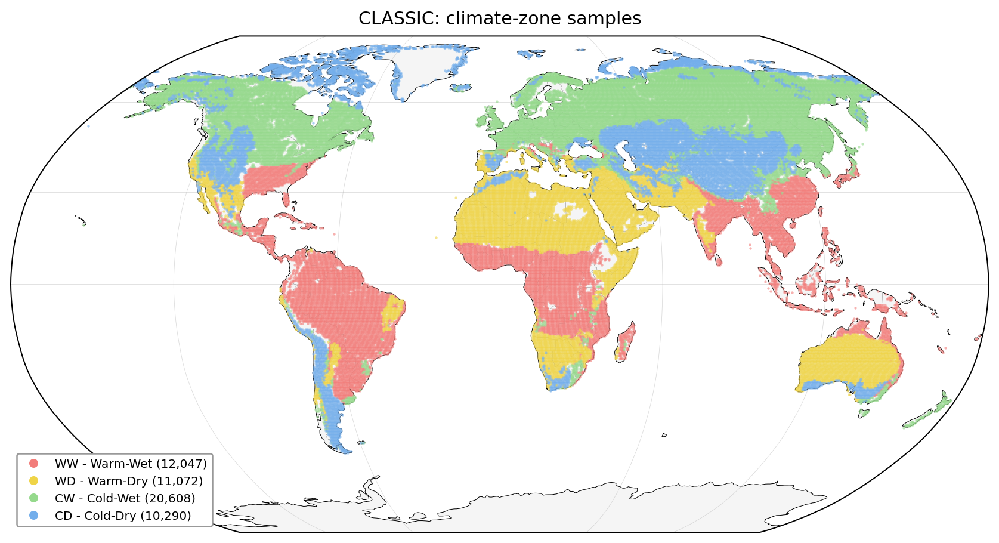

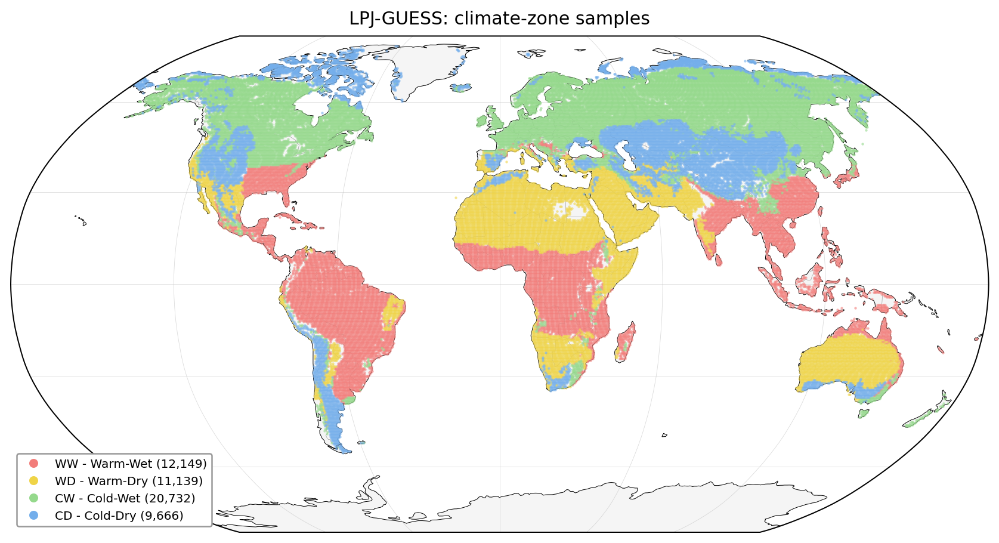

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D

# 1. 读取数据
data_dir = Path("./preprocessed/preprocessed_with_zones")

classic_df = pd.read_csv(data_dir / "classic_with_climate_zones_filtered_30yr_mean.csv")
lpj_df = pd.read_csv(data_dir / "lpj_guess_with_climate_zones_filtered_30yr_mean.csv")

# 2. 颜色
zone_colors = {
    "HW": "#F27D7A",
    "HD": "#EFD447",
    "CW": "#95D98C",
    "CD": "#73AEEB",
    "Unknown": "#BFBFBF",
}

zone_labels = {
    "HW": "WW - Warm-Wet",
    "HD": "WD - Warm-Dry",
    "CW": "CW - Cold-Wet",
    "CD": "CD - Cold-Dry",
    "Unknown": "Unknown",
}

# 3. 单张地图函数
def plot_zones_map(df, model_name, point_size=3, alpha=0.6):
    fig = plt.figure(figsize=(12, 6), dpi=180)
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()

    ax.add_feature(cfeature.OCEAN, facecolor="white", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.LAND, facecolor="#f5f5f5", edgecolor="none", zorder=0)
    ax.coastlines(linewidth=0.4, color="black", zorder=1)
    ax.add_feature(cfeature.BORDERS, linewidth=0.2, edgecolor="gray", zorder=1)

    ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,
        linewidth=0.3,
        color="0.75",
        alpha=0.6,
        linestyle="-",
        zorder=1
    )

    legend_handles = []

    for zone in ["HW", "HD", "CW", "CD", "Unknown"]:
        sub = df[df["climate_zone"] == zone]
        if len(sub) == 0:
            continue

        ax.scatter(
            sub["lon"],
            sub["lat"],
            s=point_size,
            color=zone_colors[zone],
            alpha=alpha,
            linewidth=0,
            transform=ccrs.PlateCarree(),
            zorder=2
        )

        legend_handles.append(
            Line2D(
                [0], [0],
                marker="o",
                color="none",
                markerfacecolor=zone_colors[zone],
                markeredgecolor="none",
                markersize=6,
                label=f"{zone_labels[zone]} ({len(sub):,})"
            )
        )

    ax.legend(
        handles=legend_handles,
        loc="lower left",
        fontsize=8,
        frameon=True,
        framealpha=1,
        facecolor="white",
        edgecolor="0.6"
    )

    ax.set_title(f"{model_name}: climate-zone samples", fontsize=12, pad=8)
    plt.show()

# 4. 分别画
plot_zones_map(classic_df, "CLASSIC")
plot_zones_map(lpj_df, "LPJ-GUESS")

# form
## functional relationship

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.lines import Line2D
from scipy.stats import spearmanr

# 1. 读取数据
data_dir = Path("./preprocessed/preprocessed_with_zones")

classic_df = pd.read_csv(data_dir / "classic_with_climate_zones_filtered_30yr_mean.csv")
lpj_df = pd.read_csv(data_dir / "lpj_guess_with_climate_zones_filtered_30yr_mean.csv")

# 2. 变量列名映射
var_map = {
    "P": "precipitation",
    "T": "tran",
    "LAI": "lai",
    "ET": "evapotrans",
    "E_veg": "evspsblveg",
    "E_soil": "evspsblsoi"
}

# 3. 核心组合
pairs = [
    ("P", "ET"),
    ("P", "T"),
    ("P", "E_veg"),
    ("P", "E_soil"),
    ("LAI", "ET"),
    ("LAI", "T"),
    ("LAI", "E_veg"),
    ("LAI", "E_soil"),
]

zone_colors = {
    "HW": "#F27D7A",
    "HD": "#EFD447",
    "CW": "#95D98C",
    "CD": "#73AEEB",
}

zone_labels = {
    "HW": "WW - Warm-Wet",
    "HD": "WD - Warm-Dry",
    "CW": "CW - Cold-Wet",
    "CD": "CD - Cold-Dry",
}

# full_label_map = {
#     "P": "Precipitation",
#     "LAI": "Leaf Area Index",
#     "ET": "Evapotranspiration",
#     "T": "Transpiration",
#     "E_veg": "Vegetation Evaporation",
#     "E_soil": "Soil Evaporation"
# }
full_label_map = {
    "P": "Precipitation (mm yr$^{-1}$)",
    "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
    "ET": "Evapotranspiration (mm yr$^{-1}$)",
    "T": "Transpiration (mm yr$^{-1}$)",
    "E_veg": "Vegetation Evaporation (mm yr$^{-1}$)",
    "E_soil": "Soil Evaporation (mm yr$^{-1}$)"
}

def compute_binned_medians(x, y, n_bins=10):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) == 0:
        return np.array([]), np.array([])

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    # 等样本数分箱
    indices = np.array_split(np.arange(len(x_sorted)), n_bins)

    x_med = []
    y_med = []

    for idx in indices:
        if len(idx) == 0:
            continue
        x_med.append(np.median(x_sorted[idx]))
        y_med.append(np.median(y_sorted[idx]))

    return np.array(x_med), np.array(y_med)

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.stats import spearmanr

def plot_pairs_two_models_binned_median_single_x(
    classic_df,
    lpj_df,
    x_label,
    y_labels,
    var_map,
    zone_colors,
    zone_labels,
    sample_size=30000,
    n_bins=10,
    point_size=3,
    point_alpha=0.45
):
    fig, axes = plt.subplots(2, 4, figsize=(17, 8), dpi=180)

    model_specs = [
        (classic_df, "CLASSIC"),
        (lpj_df, "LPJ-GUESS")
    ]

    x_col = var_map[x_label]

    # =========================================================
    # 先计算每一列的统一 y 轴范围
    # 也就是同一个 y_label 下，CLASSIC 和 LPJ-GUESS 共用 y limits
    # =========================================================
    y_limits = {}

    for y_label in y_labels:
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            vals = df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values
            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)
            ymin, ymax = np.nanpercentile(y_all, [1, 99])

            # 给一点边距
            yrange = ymax - ymin
            if yrange == 0:
                yrange = 1

            y_limits[y_label] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    # =========================================================
    # 正式绘图
    # =========================================================
    for row, (df, model_name) in enumerate(model_specs):
        for col_idx, y_label in enumerate(y_labels):
            ax = axes[row, col_idx]

            y_col = var_map[y_label]
            spearman_texts = []

            for zone in ["HW", "HD", "CW", "CD"]:
                sub = df[df["climate_zone"] == zone][[x_col, y_col]].dropna().copy()

                if len(sub) == 0:
                    continue

                rho, _ = spearmanr(sub[x_col].values, sub[y_col].values)
                spearman_texts.append((zone, rho))

                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                else:
                    sub_plot = sub

                ax.scatter(
                    sub_plot[x_col].values,
                    sub_plot[y_col].values,
                    s=point_size,
                    alpha=point_alpha,
                    color=zone_colors[zone],
                    linewidths=0,
                    zorder=2
                )

                x_med, y_med = compute_binned_medians(
                    sub[x_col].values,
                    sub[y_col].values,
                    n_bins=n_bins
                )

                if len(x_med) > 1:
                    ax.plot(
                        x_med, y_med,
                        color="white",
                        linewidth=4.2,
                        alpha=0.9,
                        zorder=4
                    )
                    ax.plot(
                        x_med, y_med,
                        color=zone_colors[zone],
                        linewidth=2.4,
                        zorder=5
                    )

            # =================================================
            # 每个子图内部 label：模型 + x + y
            # =================================================
            # ax.text(
            #     0.03, 0.97,
            #     f"{model_name}\nX: {x_label}   Y: {y_label}",
            #     transform=ax.transAxes,
            #     fontsize=12,
            #     fontweight="bold",
            #     ha="left",
            #     va="top",
            #     bbox=dict(
            #         boxstyle="round,pad=0.25",
            #         facecolor="white",
            #         edgecolor="0.65",
            #         alpha=0.9
            #     ),
            #     zorder=20
            # )

            ax.text(
                0.03, 0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.9
                ),
                zorder=20
            )

            # =================================================
            # Spearman 标签位置
            # 避开左上角模型 label，所以统一放右上角
            # =================================================
            x_text = 0.97
            ha_text = "right"

            y0 = 0.97
            dy = 0.075

            for i, (zone, rho) in enumerate(spearman_texts):
                ax.text(
                    x_text, y0 - i * dy,
                    rf"$\rho_s = {rho:.2f}$",
                    transform=ax.transAxes,
                    fontsize=12,
                    color=zone_colors[zone],
                    ha=ha_text,
                    va="top",
                    bbox=dict(
                        boxstyle="round,pad=0.18",
                        facecolor="white",
                        edgecolor="none",
                        alpha=0.75
                    ),
                    zorder=10
                )

            # =================================================
            # 每个子图都保留 x/y 轴
            # =================================================
            # ax.set_xlabel(x_label, fontsize=13)
            # ax.set_ylabel(y_label, fontsize=13)

            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=13)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=13)

            # 不再使用每列标题，避免和子图 label 重复
            ax.set_title("")

            # =================================================
            # y 轴按列对齐
            # =================================================
            if y_label in y_limits:
                ax.set_ylim(y_limits[y_label])

            # 背景和网格
            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(True, which="major", color="0.82", linestyle="-", linewidth=0.8)
            ax.minorticks_off()

            # 四边框都显示
            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=11,
                length=4,
                width=0.8,
                color="0.35"
            )

    # =========================================================
    # 图例
    # =========================================================
    legend_elements = [
        Line2D(
            [0], [0],
            marker='o',
            color=zone_colors[z],
            markerfacecolor=zone_colors[z],
            markeredgecolor='none',
            linewidth=2,
            markersize=7,
            label=zone_labels[z]
        )
        for z in ["HW", "HD", "CW", "CD"]
    ]

    fig.legend(
        handles=legend_elements,
        loc="lower center",
        ncol=4,
        frameon=True,
        fontsize=13,
        bbox_to_anchor=(0.5, -0.01)
    )

    fig.suptitle(
        f"{x_label} as predictor: core pair relationships by climate zone",
        fontsize=16,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.06, 1, 0.94])
    plt.show()

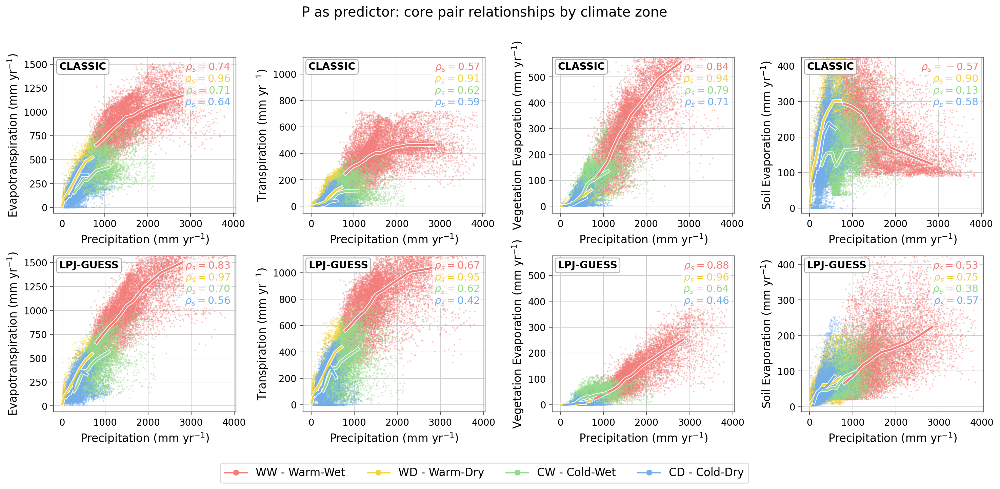

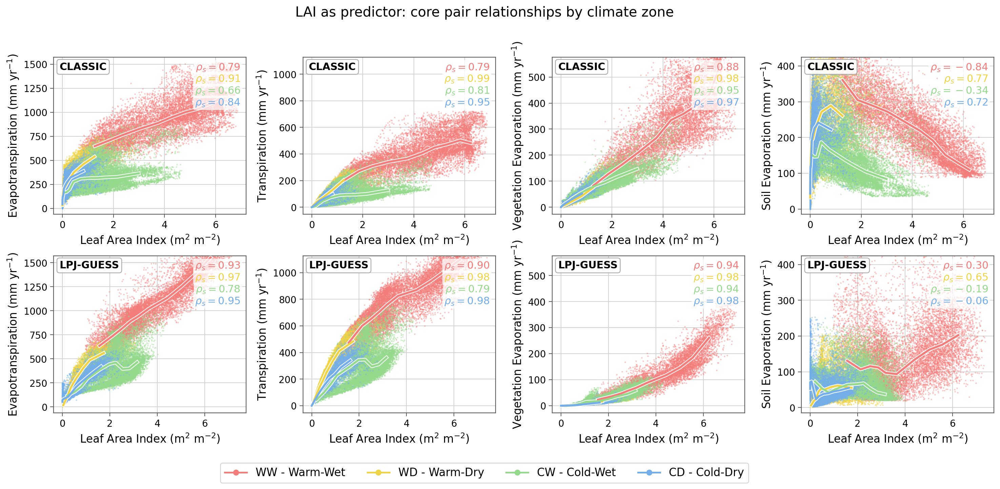

In [21]:


plot_pairs_two_models_binned_median_single_x(
    classic_df,
    lpj_df,
    x_label="P",
    y_labels=["ET", "T", "E_veg", "E_soil"],
    var_map=var_map,
    zone_colors=zone_colors,
    zone_labels=zone_labels,
    n_bins=10
)

plot_pairs_two_models_binned_median_single_x(
    classic_df,
    lpj_df,
    x_label="LAI",
    y_labels=["ET", "T", "E_veg", "E_soil"],
    var_map=var_map,
    zone_colors=zone_colors,
    zone_labels=zone_labels,
    n_bins=10
)

## T analysis  --ww

### 先分析T的曲线

#### LOWESS

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess


def compute_lowess_curve_metrics(x, y, frac=0.18):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return None, {
            "fitted_range": np.nan,
            "mean_abs_slope": np.nan,
            "max_abs_slope": np.nan
        }

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    smoothed = lowess(y, x, frac=frac, return_sorted=True)
    xs = smoothed[:, 0]
    ys = smoothed[:, 1]

    uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
    xs = xs[uniq_idx]
    ys = ys[uniq_idx]

    if len(xs) < 2:
        return smoothed, {
            "fitted_range": np.nan,
            "mean_abs_slope": np.nan,
            "max_abs_slope": np.nan
        }

    dx = np.diff(xs)
    dy = np.diff(ys)

    valid_slope = dx != 0

    if valid_slope.sum() == 0:
        mean_abs_slope = np.nan
        max_abs_slope = np.nan
    else:
        slopes = dy[valid_slope] / dx[valid_slope]
        mean_abs_slope = float(np.mean(np.abs(slopes)))
        max_abs_slope = float(np.max(np.abs(slopes)))

    fitted_range = float(np.max(ys) - np.min(ys))

    return smoothed, {
        "fitted_range": fitted_range,
        "mean_abs_slope": mean_abs_slope,
        "max_abs_slope": max_abs_slope
    }


def plot_hw_lowess_t_only(
    classic_df,
    lpj_df,
    var_map,
    frac=0.18,
    sample_size=30000,
    point_size=3,
    point_alpha=0.30
):
    # 只保留 HW climate zone
    classic_hw = classic_df[classic_df["climate_zone"] == "HW"].copy()
    lpj_hw = lpj_df[lpj_df["climate_zone"] == "HW"].copy()

    model_specs = [
        (classic_hw, "CLASSIC"),
        (lpj_hw, "LPJ-GUESS")
    ]

    panel_specs = [
        ("P", "T", "#8FBCE6"),
        ("LAI", "T", "#54A24B")
    ]

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)"
    }

    # =====================================================
    # y 轴范围按列对齐
    # 即 P-T 的上下两个模型共享 y range，
    # LAI-T 的上下两个模型共享 y range
    # =====================================================
    y_limits = {}

    for col, (x_label, y_label, _) in enumerate(panel_specs):
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            vals = df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values
            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)

            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[col] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2, 2,
        figsize=(10.5, 7.2),
        dpi=180
    )

    for row, (df, model_name) in enumerate(model_specs):
        for col, (x_label, y_label, line_color) in enumerate(panel_specs):
            ax = axes[row, col]

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = df[[x_col, y_col]].dropna().copy()

            if len(sub) > 0:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                else:
                    sub_plot = sub

                ax.scatter(
                    sub_plot[x_col].values,
                    sub_plot[y_col].values,
                    s=point_size,
                    alpha=point_alpha,
                    color=line_color,
                    linewidths=0,
                    zorder=2
                )

                smoothed, metrics = compute_lowess_curve_metrics(
                    sub[x_col].values,
                    sub[y_col].values,
                    frac=frac
                )

                if smoothed is not None:
                    ax.plot(
                        smoothed[:, 0],
                        smoothed[:, 1],
                        color="white",
                        linewidth=4.0,
                        alpha=0.9,
                        zorder=4
                    )
                    ax.plot(
                        smoothed[:, 0],
                        smoothed[:, 1],
                        color=line_color,
                        linewidth=2.5,
                        zorder=5
                    )

                # 指标放右上角
                # ax.text(
                #     0.97, 0.97,
                #     f"Fitted range = {metrics['fitted_range']:.1f}\n"
                #     f"Mean abs slope = {metrics['mean_abs_slope']:.2f}\n"
                #     f"Max abs slope = {metrics['max_abs_slope']:.2f}",
                #     transform=ax.transAxes,
                #     fontsize=9.5,
                #     color="black",
                #     ha="right",
                #     va="top",
                #     bbox=dict(
                #         boxstyle="round,pad=0.20",
                #         facecolor="white",
                #         edgecolor="none",
                #         alpha=0.85
                #     ),
                #     zorder=10
                # )

            # =================================================
            # 子图内部模型 label，只写模型名
            # =================================================
            ax.text(
                0.03, 0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            # =================================================
            # 每个子图都保留自己的 x/y 轴
            # =================================================
            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            # y 轴按列对齐
            if col in y_limits:
                ax.set_ylim(y_limits[col])

            # 标题写完整关系
            ax.set_title(
                f"{full_label_map.get(x_label, x_label).split(' (')[0]} → "
                f"{full_label_map.get(y_label, y_label).split(' (')[0]}",
                fontsize=13,
                pad=9
            )

            # 背景和网格
            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            # 四边框
            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=11,
                length=4,
                width=0.8,
                color="0.35"
            )

    fig.suptitle(
        "Warm-wet zone: LOWESS fits for Transpiration against Precipitation and Leaf Area Index",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.94])
    plt.show()

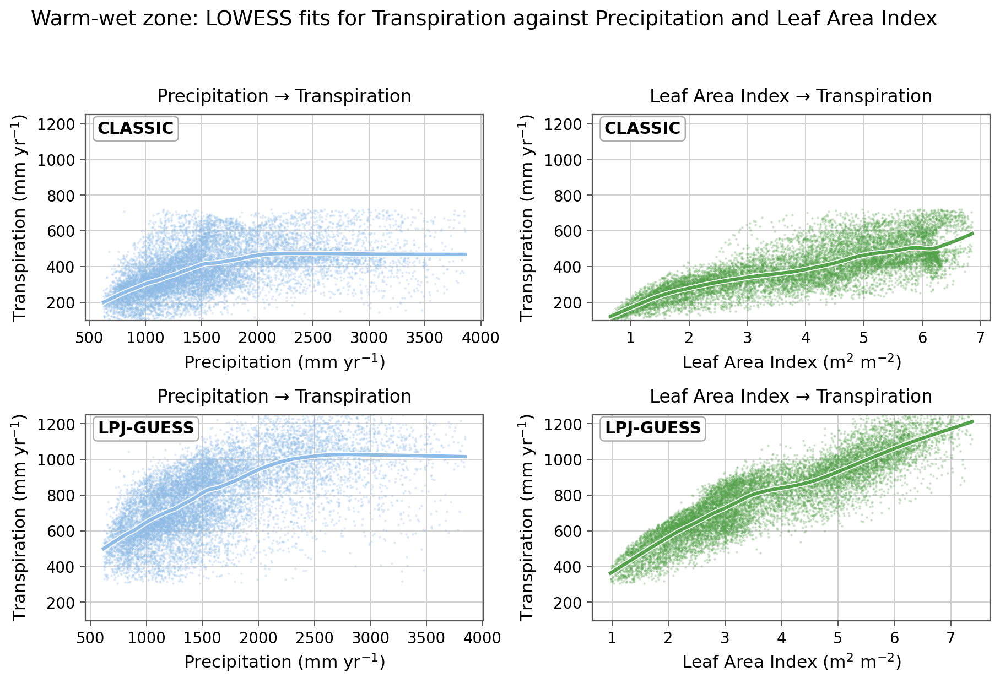

In [29]:
plot_hw_lowess_t_only(
    classic_df,
    lpj_df,
    var_map=var_map,
    frac=0.18
)

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess


def compute_lowess_curve_metrics(x, y, frac=0.18):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return None

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    smoothed = lowess(y, x, frac=frac, return_sorted=True)

    xs = smoothed[:, 0]
    uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
    smoothed = smoothed[uniq_idx]

    if len(smoothed) < 2:
        return None

    return smoothed


def plot_hw_lowess_t_only_by_predictor(
    classic_df,
    lpj_df,
    var_map,
    frac=0.18,
    sample_size=30000,
    point_size=3,
    point_alpha=0.30
):
    classic_hw = classic_df[classic_df["climate_zone"] == "HW"].copy()
    lpj_hw = lpj_df[lpj_df["climate_zone"] == "HW"].copy()

    model_specs = [
        (classic_hw, "CLASSIC"),
        (lpj_hw, "LPJ-GUESS")
    ]

    row_specs = [
        ("P", "T", "#8FBCE6"),
        ("LAI", "T", "#54A24B")
    ]

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)"
    }

    short_label_map = {
        "P": "Precipitation",
        "LAI": "Leaf Area Index",
        "T": "Transpiration"
    }

    # =====================================================
    # y 轴按行对齐：
    # 第一行 P → T 的 CLASSIC / LPJ 共用 y 轴范围
    # 第二行 LAI → T 的 CLASSIC / LPJ 共用 y 轴范围
    # =====================================================
    y_limits = {}

    for row, (x_label, y_label, _) in enumerate(row_specs):
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            vals = df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values
            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)

            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2, 2,
        figsize=(10.5, 7.2),
        dpi=180
    )

    for row, (x_label, y_label, line_color) in enumerate(row_specs):
        for col, (df, model_name) in enumerate(model_specs):
            ax = axes[row, col]

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = df[[x_col, y_col]].dropna().copy()

            if len(sub) > 0:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                else:
                    sub_plot = sub

                ax.scatter(
                    sub_plot[x_col].values,
                    sub_plot[y_col].values,
                    s=point_size,
                    alpha=point_alpha,
                    color=line_color,
                    linewidths=0,
                    zorder=2
                )

                smoothed = compute_lowess_curve_metrics(
                    sub[x_col].values,
                    sub[y_col].values,
                    frac=frac
                )

                if smoothed is not None:
                    ax.plot(
                        smoothed[:, 0],
                        smoothed[:, 1],
                        color="white",
                        linewidth=4.0,
                        alpha=0.9,
                        zorder=4
                    )
                    ax.plot(
                        smoothed[:, 0],
                        smoothed[:, 1],
                        color=line_color,
                        linewidth=2.5,
                        zorder=5
                    )

            # 子图内部模型 label
            ax.text(
                0.03, 0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            # y 轴按行对齐
            if row in y_limits:
                ax.set_ylim(y_limits[row])

            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=11,
                length=4,
                width=0.8,
                color="0.35"
            )

    fig.suptitle(
        "Warm-wet zone: LOWESS fits for Transpiration",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.94])
    plt.show()

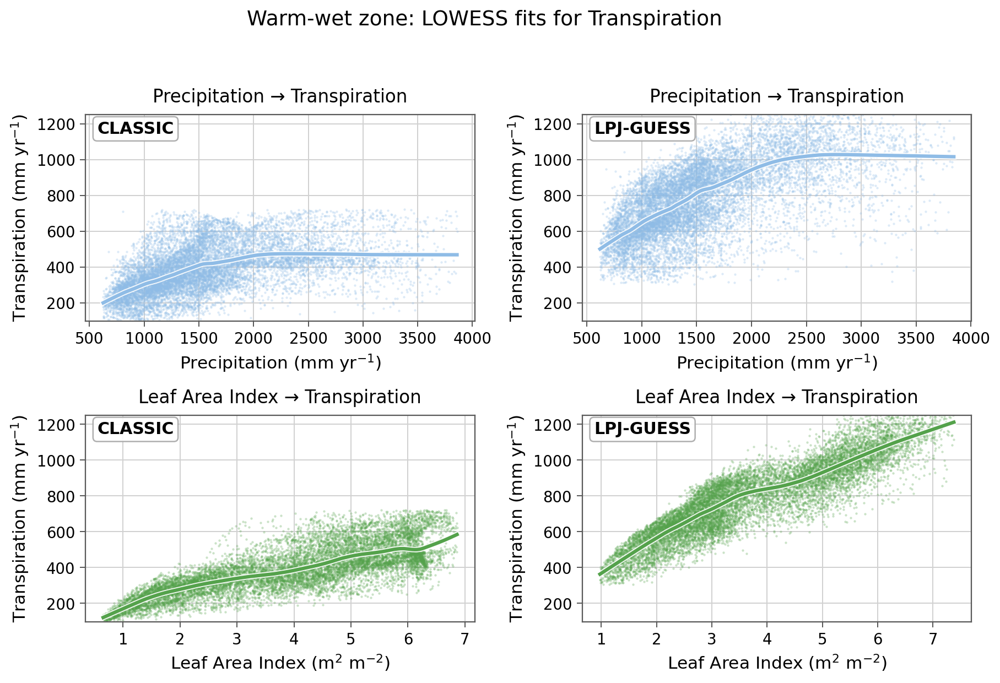

In [31]:
plot_hw_lowess_t_only_by_predictor(
    classic_df,
    lpj_df,
    var_map=var_map,
    frac=0.18
)

#### 等数量bin

In [36]:
import numpy as np
import matplotlib.pyplot as plt


def compute_equal_count_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    # 按 x 排序
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    # 等数量切分
    bin_indices = np.array_split(np.arange(len(x)), n_bins)

    x_meds = []
    y_meds = []

    for idx in bin_indices:
        if len(idx) < min_count_per_bin:
            continue

        x_meds.append(np.nanmedian(x[idx]))
        y_meds.append(np.nanmedian(y[idx]))

    return np.array(x_meds), np.array(y_meds)


def plot_hw_binned_t_only_by_predictor(
    classic_df,
    lpj_df,
    var_map,
    n_bins=10,
    min_count_per_bin=20,
    sample_size=30000,
    point_size=3,
    point_alpha=0.30
):
    classic_hw = classic_df[classic_df["climate_zone"] == "HW"].copy()
    lpj_hw = lpj_df[lpj_df["climate_zone"] == "HW"].copy()

    model_specs = [
        (classic_hw, "CLASSIC"),
        (lpj_hw, "LPJ-GUESS")
    ]

    row_specs = [
        ("P", "T", "#8FBCE6"),
        ("LAI", "T", "#54A24B")
    ]

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)"
    }

    short_label_map = {
        "P": "Precipitation",
        "LAI": "Leaf Area Index",
        "T": "Transpiration"
    }

    # y 轴按行对齐
    y_limits = {}

    for row, (x_label, y_label, _) in enumerate(row_specs):
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            vals = df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values
            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)
            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2, 2,
        figsize=(10.5, 7.2),
        dpi=180
    )

    for row, (x_label, y_label, line_color) in enumerate(row_specs):
        for col, (df, model_name) in enumerate(model_specs):
            ax = axes[row, col]

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = df[[x_col, y_col]].dropna().copy()

            if len(sub) > 0:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                else:
                    sub_plot = sub

                # 散点
                ax.scatter(
                    sub_plot[x_col].values,
                    sub_plot[y_col].values,
                    s=point_size,
                    alpha=point_alpha,
                    color=line_color,
                    linewidths=0,
                    zorder=2
                )

                # 等数量 bin 中位数曲线
                x_med, y_med = compute_equal_count_binned_medians(
                    sub[x_col].values,
                    sub[y_col].values,
                    n_bins=n_bins,
                    min_count_per_bin=min_count_per_bin
                )

                if len(x_med) > 1:
                    ax.plot(
                        x_med,
                        y_med,
                        color="white",
                        linewidth=4.2,
                        alpha=0.9,
                        zorder=4
                    )
                    ax.plot(
                        x_med,
                        y_med,
                        color=line_color,
                        linewidth=2.6,
                        # marker="o",
                        # markersize=4.2,
                        # markerfacecolor=line_color,
                        # markeredgecolor="white",
                        # markeredgewidth=0.8,
                        zorder=5
                    )

            # 子图内部模型 label
            ax.text(
                0.03, 0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            if row in y_limits:
                ax.set_ylim(y_limits[row])

            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=11,
                length=4,
                width=0.8,
                color="0.35"
            )

    fig.suptitle(
        "Warm-wet zone: equal-count binned median curves for Transpiration",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.94])
    plt.show()

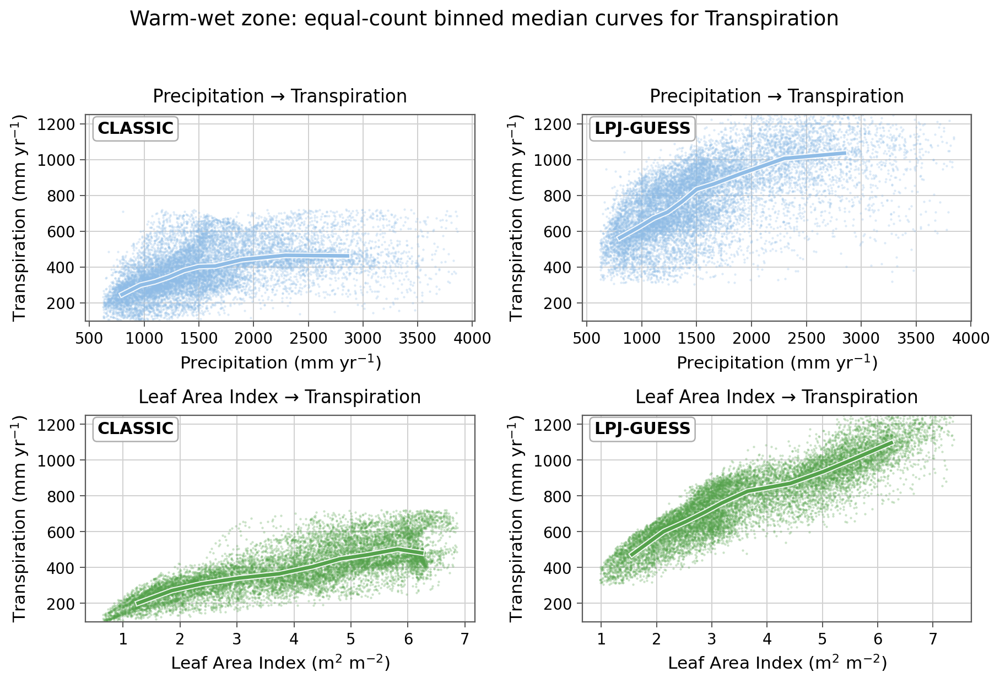

In [37]:
plot_hw_binned_t_only_by_predictor(
    classic_df,
    lpj_df,
    var_map=var_map,
    n_bins=10,
    min_count_per_bin=20
)

#### 等宽bin

等数量 bin：每个 bin 里点数差不多一样
等宽 bin：x 轴范围被切成等宽区间，每个 bin 的 x 宽度一样

In [39]:
import numpy as np
import matplotlib.pyplot as plt


def compute_equal_width_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    """
    Equal-width binned median curve.

    Steps:
    1. Divide the x range into equal-width intervals.
    2. Compute median x and median y within each interval.
    3. Return the median points for drawing a fitted trend line.
    """
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    x_min, x_max = np.nanmin(x), np.nanmax(x)

    if x_min == x_max:
        return np.array([]), np.array([])

    bin_edges = np.linspace(x_min, x_max, n_bins + 1)

    x_meds = []
    y_meds = []

    for i in range(n_bins):
        left = bin_edges[i]
        right = bin_edges[i + 1]

        if i == n_bins - 1:
            mask = (x >= left) & (x <= right)
        else:
            mask = (x >= left) & (x < right)

        if np.sum(mask) < min_count_per_bin:
            continue

        x_meds.append(np.nanmedian(x[mask]))
        y_meds.append(np.nanmedian(y[mask]))

    return np.array(x_meds), np.array(y_meds)


def plot_hw_equal_width_binned_t_only_by_predictor(
    classic_df,
    lpj_df,
    var_map,
    n_bins=10,
    min_count_per_bin=20,
    sample_size=30000,
    point_size=3,
    point_alpha=0.30
):
    # 只保留 warm-wet zone
    classic_hw = classic_df[classic_df["climate_zone"] == "HW"].copy()
    lpj_hw = lpj_df[lpj_df["climate_zone"] == "HW"].copy()

    model_specs = [
        (classic_hw, "CLASSIC"),
        (lpj_hw, "LPJ-GUESS")
    ]

    # 第一行：P → T
    # 第二行：LAI → T
    row_specs = [
        ("P", "T", "#8FBCE6"),
        ("LAI", "T", "#54A24B")
    ]

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)"
    }

    short_label_map = {
        "P": "Precipitation",
        "LAI": "Leaf Area Index",
        "T": "Transpiration"
    }

    # =====================================================
    # y 轴按行对齐：
    # P → T 的两个模型共用 y 轴范围
    # LAI → T 的两个模型共用 y 轴范围
    # =====================================================
    y_limits = {}

    for row, (x_label, y_label, _) in enumerate(row_specs):
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            vals = df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values
            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)

            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2, 2,
        figsize=(10.5, 7.2),
        dpi=180
    )

    for row, (x_label, y_label, line_color) in enumerate(row_specs):
        for col, (df, model_name) in enumerate(model_specs):
            ax = axes[row, col]

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = df[[x_col, y_col]].dropna().copy()

            if len(sub) > 0:
                if len(sub) > sample_size:
                    sub_plot = sub.sample(sample_size, random_state=42)
                else:
                    sub_plot = sub

                # 散点
                ax.scatter(
                    sub_plot[x_col].values,
                    sub_plot[y_col].values,
                    s=point_size,
                    alpha=point_alpha,
                    color=line_color,
                    linewidths=0,
                    zorder=2
                )

                # 等宽 bin 中位数曲线
                x_med, y_med = compute_equal_width_binned_medians(
                    sub[x_col].values,
                    sub[y_col].values,
                    n_bins=n_bins,
                    min_count_per_bin=min_count_per_bin
                )

                if len(x_med) > 1:
                    # 白色描边，让曲线从散点里凸显出来
                    ax.plot(
                        x_med,
                        y_med,
                        color="white",
                        linewidth=4.2,
                        alpha=0.9,
                        zorder=4
                    )

                    # 主曲线：不画 bin 点
                    ax.plot(
                        x_med,
                        y_med,
                        color=line_color,
                        linewidth=2.8,
                        zorder=5
                    )

            # 子图内部模型 label
            ax.text(
                0.03, 0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            # 坐标轴标签：全称 + 单位
            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            # y 轴按行对齐
            if row in y_limits:
                ax.set_ylim(y_limits[row])

            # 标题用箭头，不用 vs
            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            # 背景和网格
            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            # 四边框
            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=11,
                length=4,
                width=0.8,
                color="0.35"
            )

    fig.suptitle(
        "Warm-wet zone: equal-width binned median curves for Transpiration",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.03, 1, 0.94])
    plt.show()

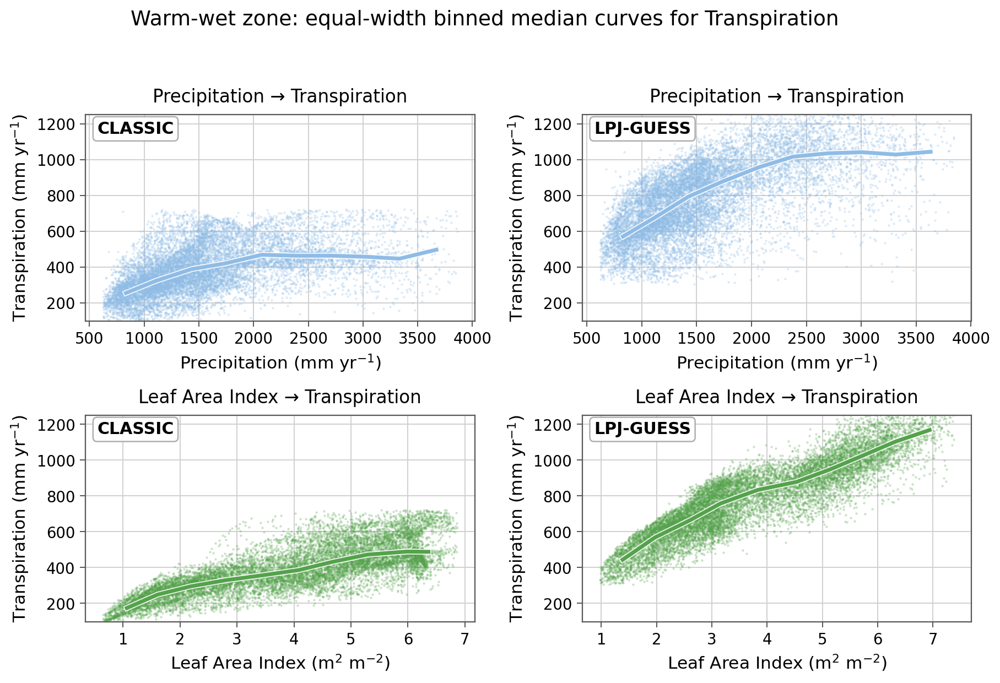

In [40]:
plot_hw_equal_width_binned_t_only_by_predictor(
    classic_df,
    lpj_df,
    var_map=var_map,
    n_bins=10,
    min_count_per_bin=20
)

### 那么多方法都画在图上

In [41]:
import numpy as np
import matplotlib.pyplot as plt

from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit


# =========================================================
# 1. Equal-width bins
# =========================================================
def compute_equal_width_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    x_min, x_max = np.nanmin(x), np.nanmax(x)
    if x_min == x_max:
        return np.array([]), np.array([])

    edges = np.linspace(x_min, x_max, n_bins + 1)

    x_med, y_med = [], []

    for i in range(n_bins):
        left, right = edges[i], edges[i + 1]

        if i == n_bins - 1:
            mask = (x >= left) & (x <= right)
        else:
            mask = (x >= left) & (x < right)

        if np.sum(mask) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[mask]))
        y_med.append(np.nanmedian(y[mask]))

    return np.array(x_med), np.array(y_med)


# =========================================================
# 2. Equal-count bins
# =========================================================
def compute_equal_count_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    bin_indices = np.array_split(np.arange(len(x)), n_bins)

    x_med, y_med = [], []

    for idx in bin_indices:
        if len(idx) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[idx]))
        y_med.append(np.nanmedian(y[idx]))

    return np.array(x_med), np.array(y_med)


# =========================================================
# 3. Polynomial regression
# =========================================================
def fit_polynomial_curve(x, y, degree=3, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < degree + 2:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_poly = poly.fit_transform(x.reshape(-1, 1))

    model = LinearRegression()
    model.fit(X_poly, y)

    y_grid = model.predict(poly.transform(x_grid.reshape(-1, 1)))

    return x_grid, y_grid


# =========================================================
# 4. Piecewise linear regression
#    这里用一个断点的 piecewise linear
# =========================================================
def piecewise_linear_one_break(x, x0, k1, k2, b):
    return np.where(
        x < x0,
        k1 * x + b,
        k1 * x0 + b + k2 * (x - x0)
    )


def fit_piecewise_linear_curve(x, y, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None, None

    x_min, x_max = np.min(x), np.max(x)
    x_grid = np.linspace(x_min, x_max, n_grid)

    try:
        p0 = [
            np.median(x),                         # initial breakpoint
            0.0,                                  # slope before breakpoint
            0.0,                                  # slope after breakpoint
            np.median(y)                          # intercept
        ]

        bounds = (
            [x_min, -np.inf, -np.inf, -np.inf],
            [x_max,  np.inf,  np.inf,  np.inf]
        )

        params, _ = curve_fit(
            piecewise_linear_one_break,
            x,
            y,
            p0=p0,
            bounds=bounds,
            maxfev=20000
        )

        y_grid = piecewise_linear_one_break(x_grid, *params)
        return x_grid, y_grid

    except Exception:
        return None, None


# =========================================================
# 5. GAM
#    需要 pygam。如果没有安装，会自动跳过。
# =========================================================
def fit_gam_curve(x, y, n_grid=300):
    try:
        from pygam import LinearGAM, s
    except ImportError:
        print("pygam is not installed. GAM curve skipped.")
        return None, None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    try:
        gam = LinearGAM(s(0, n_splines=12)).fit(x.reshape(-1, 1), y)
        y_grid = gam.predict(x_grid.reshape(-1, 1))
        return x_grid, y_grid
    except Exception:
        return None, None


# =========================================================
# 6. Symbolic regression
#    需要 gplearn。如果没有安装，会自动跳过。
# =========================================================
def fit_symbolic_regression_curve(x, y, n_grid=300):
    try:
        from gplearn.genetic import SymbolicRegressor
    except ImportError:
        print("gplearn is not installed. Symbolic regression curve skipped.")
        return None, None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 50:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    try:
        # 为了避免太慢，抽样训练
        max_train = 8000
        if len(x) > max_train:
            rng = np.random.default_rng(42)
            idx = rng.choice(len(x), size=max_train, replace=False)
            x_train = x[idx]
            y_train = y[idx]
        else:
            x_train = x
            y_train = y

        est = SymbolicRegressor(
            population_size=1000,
            generations=15,
            stopping_criteria=0.01,
            p_crossover=0.7,
            p_subtree_mutation=0.1,
            p_hoist_mutation=0.05,
            p_point_mutation=0.1,
            max_samples=0.8,
            verbose=0,
            parsimony_coefficient=0.01,
            random_state=42,
            function_set=("add", "sub", "mul", "div", "sqrt", "log")
        )

        est.fit(x_train.reshape(-1, 1), y_train)

        y_grid = est.predict(x_grid.reshape(-1, 1))

        print("Symbolic regression expression:")
        print(est._program)

        return x_grid, y_grid

    except Exception as e:
        print(f"Symbolic regression failed: {e}")
        return None, None


# =========================================================
# 7. Main plotting function
# =========================================================
def plot_all_fitting_methods_one_panel(
    classic_df,
    lpj_df,
    var_map,
    model_name="CLASSIC",
    climate_zone="HW",
    x_label="P",
    y_label="T",
    n_bins=10,
    frac=0.18,
    poly_degree=3,
    sample_size=30000,
    point_size=3,
    point_alpha=0.25
):
    if model_name == "CLASSIC":
        df = classic_df.copy()
    elif model_name == "LPJ-GUESS":
        df = lpj_df.copy()
    else:
        raise ValueError("model_name must be 'CLASSIC' or 'LPJ-GUESS'")

    df = df[df["climate_zone"] == climate_zone].copy()

    x_col = var_map[x_label]
    y_col = var_map[y_label]

    sub = df[[x_col, y_col]].replace([np.inf, -np.inf], np.nan).dropna().copy()

    x = sub[x_col].values
    y = sub[y_col].values

    if len(x) == 0:
        raise ValueError("No valid data available for this combination.")

    # 抽样画散点
    if len(sub) > sample_size:
        sub_plot = sub.sample(sample_size, random_state=42)
    else:
        sub_plot = sub

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)",
        "ET": "Evapotranspiration (mm yr$^{-1}$)",
        "E_veg": "Vegetation Evaporation (mm yr$^{-1}$)",
        "E_soil": "Soil Evaporation (mm yr$^{-1}$)"
    }

    short_label_map = {
        "P": "Precipitation",
        "LAI": "Leaf Area Index",
        "T": "Transpiration",
        "ET": "Evapotranspiration",
        "E_veg": "Vegetation Evaporation",
        "E_soil": "Soil Evaporation"
    }

    fig, ax = plt.subplots(figsize=(9.5, 6.6), dpi=180)

    # 散点
    ax.scatter(
        sub_plot[x_col].values,
        sub_plot[y_col].values,
        s=point_size,
        alpha=point_alpha,
        color="0.65",
        linewidths=0,
        zorder=1,
        label="Sample points"
    )

    # -----------------------------------------------------
    # Equal-width bins
    # -----------------------------------------------------
    x_ew, y_ew = compute_equal_width_binned_medians(
        x, y,
        n_bins=n_bins,
        min_count_per_bin=20
    )

    if len(x_ew) > 1:
        ax.plot(
            x_ew, y_ew,
            linewidth=2.6,
            color="#1f77b4",
            label="Equal-width bins",
            zorder=5
        )

    # -----------------------------------------------------
    # Equal-count bins
    # -----------------------------------------------------
    x_ec, y_ec = compute_equal_count_binned_medians(
        x, y,
        n_bins=n_bins,
        min_count_per_bin=20
    )

    if len(x_ec) > 1:
        ax.plot(
            x_ec, y_ec,
            linewidth=2.6,
            color="#ff7f0e",
            label="Equal-count bins",
            zorder=5
        )

    # -----------------------------------------------------
    # LOWESS
    # -----------------------------------------------------
    try:
        lowess_smoothed = lowess(y, x, frac=frac, return_sorted=True)

        xs = lowess_smoothed[:, 0]
        uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
        lowess_smoothed = lowess_smoothed[uniq_idx]

        ax.plot(
            lowess_smoothed[:, 0],
            lowess_smoothed[:, 1],
            linewidth=2.8,
            color="#2ca02c",
            label=f"LOWESS (frac={frac})",
            zorder=6
        )
    except Exception as e:
        print(f"LOWESS failed: {e}")

    # -----------------------------------------------------
    # Polynomial regression
    # -----------------------------------------------------
    x_poly, y_poly = fit_polynomial_curve(
        x,
        y,
        degree=poly_degree
    )

    if x_poly is not None:
        ax.plot(
            x_poly,
            y_poly,
            linewidth=2.4,
            color="#d62728",
            label=f"Polynomial regression degree {poly_degree}",
            zorder=4
        )

    # -----------------------------------------------------
    # GAM
    # -----------------------------------------------------
    x_gam, y_gam = fit_gam_curve(x, y)

    if x_gam is not None:
        ax.plot(
            x_gam,
            y_gam,
            linewidth=2.4,
            color="#9467bd",
            label="GAM",
            zorder=4
        )

    # -----------------------------------------------------
    # Piecewise linear regression
    # -----------------------------------------------------
    x_piece, y_piece = fit_piecewise_linear_curve(x, y)

    if x_piece is not None:
        ax.plot(
            x_piece,
            y_piece,
            linewidth=2.4,
            color="#8c564b",
            label="Piecewise linear regression",
            zorder=4
        )

    # -----------------------------------------------------
    # Symbolic regression
    # -----------------------------------------------------
    x_sym, y_sym = fit_symbolic_regression_curve(x, y)

    if x_sym is not None:
        ax.plot(
            x_sym,
            y_sym,
            linewidth=2.4,
            color="#e377c2",
            label="Symbolic regression",
            zorder=4
        )

    # 子图内部模型标签
    ax.text(
        0.03, 0.97,
        f"{model_name} | {climate_zone}",
        transform=ax.transAxes,
        fontsize=12,
        fontweight="bold",
        ha="left",
        va="top",
        bbox=dict(
            boxstyle="round,pad=0.25",
            facecolor="white",
            edgecolor="0.65",
            alpha=0.90
        ),
        zorder=20
    )

    ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=13)
    ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=13)

    ax.set_title(
        f"{short_label_map.get(x_label, x_label)} → {short_label_map.get(y_label, y_label)}",
        fontsize=15,
        pad=10
    )

    ax.set_facecolor("white")
    ax.set_axisbelow(True)
    ax.grid(
        True,
        which="major",
        color="0.82",
        linestyle="-",
        linewidth=0.8
    )

    for side in ["top", "right", "bottom", "left"]:
        ax.spines[side].set_visible(True)
        ax.spines[side].set_linewidth(0.9)
        ax.spines[side].set_color("0.35")

    ax.tick_params(
        axis="both",
        which="major",
        labelsize=11,
        length=4,
        width=0.8,
        color="0.35"
    )

    ax.legend(
        loc="best",
        fontsize=10,
        frameon=True,
        framealpha=0.92
    )

    plt.tight_layout()
    plt.show()

gplearn is not installed. Symbolic regression curve skipped.


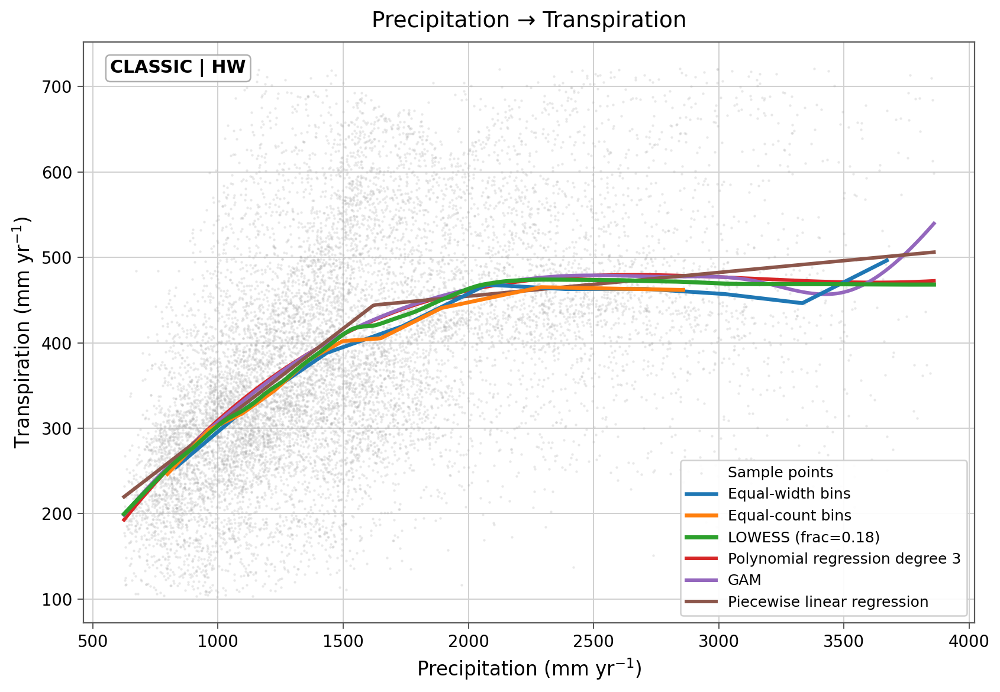

In [42]:
plot_all_fitting_methods_one_panel(
    classic_df,
    lpj_df,
    var_map=var_map,
    model_name="CLASSIC",
    climate_zone="HW",
    x_label="P",
    y_label="T",
    n_bins=10,
    frac=0.18,
    poly_degree=3
)

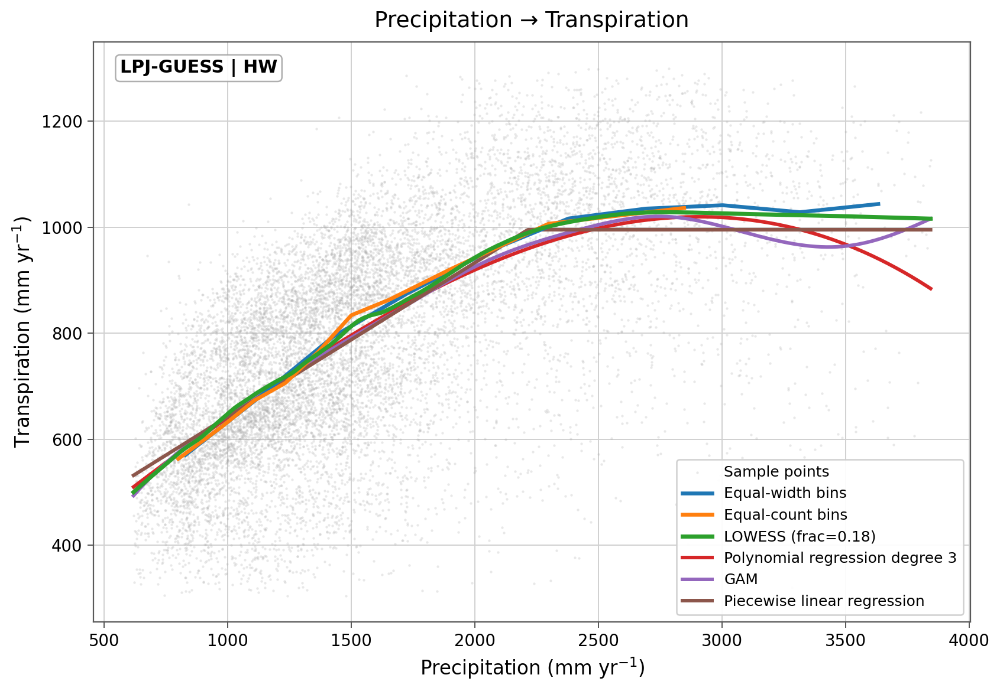

In [58]:
plot_all_fitting_methods_one_panel(
    classic_df,
    lpj_df,
    var_map=var_map,
    model_name="LPJ-GUESS",
    climate_zone="HW",
    x_label="P",
    y_label="T",
    n_bins=10,
    frac=0.18,
    poly_degree=3
)

In [54]:
import numpy as np
import matplotlib.pyplot as plt

from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit


# =========================================================
# Equal-width bins
# =========================================================
def compute_equal_width_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    x_min, x_max = np.nanmin(x), np.nanmax(x)
    if x_min == x_max:
        return np.array([]), np.array([])

    edges = np.linspace(x_min, x_max, n_bins + 1)

    x_med, y_med = [], []

    for i in range(n_bins):
        left, right = edges[i], edges[i + 1]

        if i == n_bins - 1:
            mask = (x >= left) & (x <= right)
        else:
            mask = (x >= left) & (x < right)

        if np.sum(mask) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[mask]))
        y_med.append(np.nanmedian(y[mask]))

    return np.array(x_med), np.array(y_med)


# =========================================================
# Equal-count bins
# =========================================================
def compute_equal_count_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    bin_indices = np.array_split(np.arange(len(x)), n_bins)

    x_med, y_med = [], []

    for idx in bin_indices:
        if len(idx) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[idx]))
        y_med.append(np.nanmedian(y[idx]))

    return np.array(x_med), np.array(y_med)


# =========================================================
# Polynomial regression
# =========================================================
def fit_polynomial_curve(x, y, degree=3, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < degree + 2:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_poly = poly.fit_transform(x.reshape(-1, 1))

    model = LinearRegression()
    model.fit(X_poly, y)

    y_grid = model.predict(poly.transform(x_grid.reshape(-1, 1)))

    return x_grid, y_grid


# =========================================================
# Piecewise linear regression: one breakpoint
# =========================================================
def piecewise_linear_one_break(x, x0, k1, k2, b):
    return np.where(
        x < x0,
        k1 * x + b,
        k1 * x0 + b + k2 * (x - x0)
    )


def fit_piecewise_linear_curve(x, y, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None, None

    x_min, x_max = np.min(x), np.max(x)
    x_grid = np.linspace(x_min, x_max, n_grid)

    try:
        p0 = [
            np.median(x),
            0.0,
            0.0,
            np.median(y)
        ]

        bounds = (
            [x_min, -np.inf, -np.inf, -np.inf],
            [x_max,  np.inf,  np.inf,  np.inf]
        )

        params, _ = curve_fit(
            piecewise_linear_one_break,
            x,
            y,
            p0=p0,
            bounds=bounds,
            maxfev=20000
        )

        y_grid = piecewise_linear_one_break(x_grid, *params)
        return x_grid, y_grid

    except Exception:
        return None, None


# =========================================================
# GAM
# =========================================================
def fit_gam_curve(x, y, n_grid=300):
    try:
        from pygam import LinearGAM, s
    except ImportError:
        return None, None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    try:
        gam = LinearGAM(s(0, n_splines=12)).fit(x.reshape(-1, 1), y)
        y_grid = gam.predict(x_grid.reshape(-1, 1))
        return x_grid, y_grid
    except Exception:
        return None, None


# =========================================================
# Symbolic regression
# =========================================================
def fit_symbolic_regression_curve(x, y, n_grid=300):
    try:
        from gplearn.genetic import SymbolicRegressor
    except ImportError:
        return None, None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 50:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    try:
        max_train = 8000

        if len(x) > max_train:
            rng = np.random.default_rng(42)
            idx = rng.choice(len(x), size=max_train, replace=False)
            x_train = x[idx]
            y_train = y[idx]
        else:
            x_train = x
            y_train = y

        est = SymbolicRegressor(
            population_size=1000,
            generations=15,
            stopping_criteria=0.01,
            p_crossover=0.7,
            p_subtree_mutation=0.1,
            p_hoist_mutation=0.05,
            p_point_mutation=0.1,
            max_samples=0.8,
            verbose=0,
            parsimony_coefficient=0.01,
            random_state=42,
            function_set=("add", "sub", "mul", "div", "sqrt", "log")
        )

        est.fit(x_train.reshape(-1, 1), y_train)
        y_grid = est.predict(x_grid.reshape(-1, 1))

        return x_grid, y_grid

    except Exception:
        return None, None


# =========================================================
# Main 2 × 2 plotting function
# =========================================================
def plot_all_fitting_methods_2x2(
    classic_df,
    lpj_df,
    var_map,
    climate_zone="HW",
    y_label="T",
    n_bins=10,
    frac=0.18,
    poly_degree=3,
    sample_size=30000,
    point_size=3,
    point_alpha=0.22
):
    model_specs = [
        (classic_df, "CLASSIC"),
        (lpj_df, "LPJ-GUESS")
    ]

    row_specs = [
        ("P", "#8FBCE6"),
        ("LAI", "#54A24B")
    ]

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)",
        "ET": "Evapotranspiration (mm yr$^{-1}$)",
        "E_veg": "Vegetation Evaporation (mm yr$^{-1}$)",
        "E_soil": "Soil Evaporation (mm yr$^{-1}$)"
    }

    short_label_map = {
        "P": "Precipitation",
        "LAI": "Leaf Area Index",
        "T": "Transpiration",
        "ET": "Evapotranspiration",
        "E_veg": "Vegetation Evaporation",
        "E_soil": "Soil Evaporation"
    }

    # y 轴按行对齐
    y_limits = {}

    for row, (x_label, _) in enumerate(row_specs):
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            sub_df = df[df["climate_zone"] == climate_zone].copy()
            vals = sub_df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values

            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)
            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2, 2,
        figsize=(10, 8),
        dpi=180
    )

    for row, (x_label, base_color) in enumerate(row_specs):
        for col, (df, model_name) in enumerate(model_specs):
            ax = axes[row, col]

            df_zone = df[df["climate_zone"] == climate_zone].copy()

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = (
                df_zone[[x_col, y_col]]
                .replace([np.inf, -np.inf], np.nan)
                .dropna()
                .copy()
            )

            if len(sub) == 0:
                continue

            x = sub[x_col].values
            y = sub[y_col].values

            # 散点抽样
            if len(sub) > sample_size:
                sub_plot = sub.sample(sample_size, random_state=42)
            else:
                sub_plot = sub

            ax.scatter(
                sub_plot[x_col].values,
                sub_plot[y_col].values,
                s=point_size,
                alpha=point_alpha,
                color="0.70",
                linewidths=0,
                zorder=1
            )

            # Equal-width bins
            x_ew, y_ew = compute_equal_width_binned_medians(
                x,
                y,
                n_bins=n_bins,
                min_count_per_bin=20
            )

            if len(x_ew) > 1:
                ax.plot(
                    x_ew,
                    y_ew,
                    linewidth=1.5,
                    color="#1f77b4",
                    label="Equal-width bins",
                    zorder=6
                )

            # Equal-count bins
            x_ec, y_ec = compute_equal_count_binned_medians(
                x,
                y,
                n_bins=n_bins,
                min_count_per_bin=20
            )

            if len(x_ec) > 1:
                ax.plot(
                    x_ec,
                    y_ec,
                    linewidth=1.5,
                    color="#ff7f0e",
                    label="Equal-count bins",
                    zorder=6
                )

            # LOWESS
            try:
                lowess_smoothed = lowess(y, x, frac=frac, return_sorted=True)
                xs = lowess_smoothed[:, 0]
                uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
                lowess_smoothed = lowess_smoothed[uniq_idx]

                ax.plot(
                    lowess_smoothed[:, 0],
                    lowess_smoothed[:, 1],
                    linewidth=1.5,
                    color="#2ca02c",
                    label=f"LOWESS",
                    zorder=7
                )
            except Exception:
                pass

            # Polynomial regression
            x_poly, y_poly = fit_polynomial_curve(
                x,
                y,
                degree=poly_degree
            )

            if x_poly is not None:
                ax.plot(
                    x_poly,
                    y_poly,
                    linewidth=1.5,
                    color="#d62728",
                    label=f"Polynomial",
                    zorder=5
                )

            # GAM
            x_gam, y_gam = fit_gam_curve(x, y)

            if x_gam is not None:
                ax.plot(
                    x_gam,
                    y_gam,
                    linewidth=1.5,
                    color="#9467bd",
                    label="GAM",
                    zorder=5
                )

            # Piecewise linear regression
            x_piece, y_piece = fit_piecewise_linear_curve(x, y)

            if x_piece is not None:
                ax.plot(
                    x_piece,
                    y_piece,
                    linewidth=1.5,
                    color="#8c564b",
                    label="Piecewise linear",
                    zorder=5
                )

            # Symbolic regression
            x_sym, y_sym = fit_symbolic_regression_curve(x, y)

            if x_sym is not None:
                ax.plot(
                    x_sym,
                    y_sym,
                    linewidth=1.5,
                    color="#e377c2",
                    label="Symbolic regression",
                    zorder=5
                )

            # 模型 label
            ax.text(
                0.03,
                0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            if row in y_limits:
                ax.set_ylim(y_limits[row])

            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=10.5,
                length=4,
                width=0.8,
                color="0.35"
            )

    # 统一 legend，只从第一个子图取
    handles, labels = axes[0, 0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="lower center",
        ncol=6,
        frameon=True,
        fontsize=10,
        bbox_to_anchor=(0.5, -0.01)
    )

    fig.suptitle(
        f"Warm-wet zone: comparison of fitted curves for {short_label_map.get(y_label, y_label)}",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.07, 1, 0.94])
    plt.show()

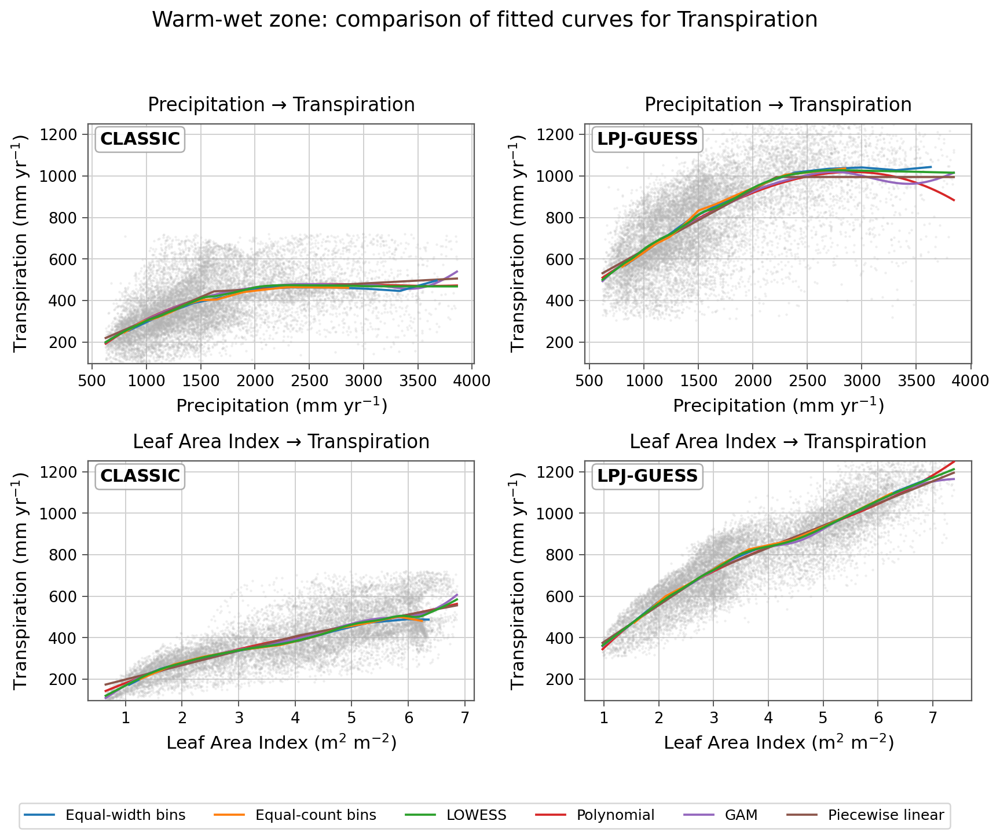

In [55]:
plot_all_fitting_methods_2x2(
    classic_df,
    lpj_df,
    var_map=var_map,
    climate_zone="HW",
    y_label="T",
    n_bins=10,
    frac=0.18,
    poly_degree=3
)

#### 看一下E_soil

In [56]:
import numpy as np
import matplotlib.pyplot as plt

from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit


# =========================================================
# Equal-width bins
# =========================================================
def compute_equal_width_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    x_min, x_max = np.nanmin(x), np.nanmax(x)
    if x_min == x_max:
        return np.array([]), np.array([])

    edges = np.linspace(x_min, x_max, n_bins + 1)

    x_med, y_med = [], []

    for i in range(n_bins):
        left, right = edges[i], edges[i + 1]

        if i == n_bins - 1:
            mask = (x >= left) & (x <= right)
        else:
            mask = (x >= left) & (x < right)

        if np.sum(mask) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[mask]))
        y_med.append(np.nanmedian(y[mask]))

    return np.array(x_med), np.array(y_med)


# =========================================================
# Equal-count bins
# =========================================================
def compute_equal_count_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return np.array([]), np.array([])

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    bin_indices = np.array_split(np.arange(len(x)), n_bins)

    x_med, y_med = [], []

    for idx in bin_indices:
        if len(idx) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[idx]))
        y_med.append(np.nanmedian(y[idx]))

    return np.array(x_med), np.array(y_med)


# =========================================================
# Polynomial regression
# =========================================================
def fit_polynomial_curve(x, y, degree=3, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < degree + 2:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    poly = PolynomialFeatures(degree=degree, include_bias=False)
    X_poly = poly.fit_transform(x.reshape(-1, 1))

    model = LinearRegression()
    model.fit(X_poly, y)

    y_grid = model.predict(poly.transform(x_grid.reshape(-1, 1)))

    return x_grid, y_grid


# =========================================================
# Piecewise linear regression: one breakpoint
# =========================================================
def piecewise_linear_one_break(x, x0, k1, k2, b):
    return np.where(
        x < x0,
        k1 * x + b,
        k1 * x0 + b + k2 * (x - x0)
    )


def fit_piecewise_linear_curve(x, y, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None, None

    x_min, x_max = np.min(x), np.max(x)
    x_grid = np.linspace(x_min, x_max, n_grid)

    try:
        p0 = [
            np.median(x),
            0.0,
            0.0,
            np.median(y)
        ]

        bounds = (
            [x_min, -np.inf, -np.inf, -np.inf],
            [x_max,  np.inf,  np.inf,  np.inf]
        )

        params, _ = curve_fit(
            piecewise_linear_one_break,
            x,
            y,
            p0=p0,
            bounds=bounds,
            maxfev=20000
        )

        y_grid = piecewise_linear_one_break(x_grid, *params)
        return x_grid, y_grid

    except Exception:
        return None, None


# =========================================================
# GAM
# =========================================================
def fit_gam_curve(x, y, n_grid=300):
    try:
        from pygam import LinearGAM, s
    except ImportError:
        return None, None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    try:
        gam = LinearGAM(s(0, n_splines=12)).fit(x.reshape(-1, 1), y)
        y_grid = gam.predict(x_grid.reshape(-1, 1))
        return x_grid, y_grid
    except Exception:
        return None, None


# =========================================================
# Symbolic regression
# =========================================================
def fit_symbolic_regression_curve(x, y, n_grid=300):
    try:
        from gplearn.genetic import SymbolicRegressor
    except ImportError:
        return None, None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 50:
        return None, None

    x_grid = np.linspace(np.min(x), np.max(x), n_grid)

    try:
        max_train = 8000

        if len(x) > max_train:
            rng = np.random.default_rng(42)
            idx = rng.choice(len(x), size=max_train, replace=False)
            x_train = x[idx]
            y_train = y[idx]
        else:
            x_train = x
            y_train = y

        est = SymbolicRegressor(
            population_size=1000,
            generations=15,
            stopping_criteria=0.01,
            p_crossover=0.7,
            p_subtree_mutation=0.1,
            p_hoist_mutation=0.05,
            p_point_mutation=0.1,
            max_samples=0.8,
            verbose=0,
            parsimony_coefficient=0.01,
            random_state=42,
            function_set=("add", "sub", "mul", "div", "sqrt", "log")
        )

        est.fit(x_train.reshape(-1, 1), y_train)
        y_grid = est.predict(x_grid.reshape(-1, 1))

        return x_grid, y_grid

    except Exception:
        return None, None


# =========================================================
# Main 2 × 2 plotting function
# =========================================================
def plot_all_fitting_methods_2x2(
    classic_df,
    lpj_df,
    var_map,
    climate_zone="HW",
    y_label="T",
    n_bins=10,
    frac=0.18,
    poly_degree=3,
    sample_size=30000,
    point_size=3,
    point_alpha=0.22
):
    model_specs = [
        (classic_df, "CLASSIC"),
        (lpj_df, "LPJ-GUESS")
    ]

    row_specs = [
        ("P", "#8FBCE6"),
        ("LAI", "#54A24B")
    ]

    full_label_map = {
        "P": "Precipitation (mm yr$^{-1}$)",
        "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
        "T": "Transpiration (mm yr$^{-1}$)",
        "ET": "Evapotranspiration (mm yr$^{-1}$)",
        "E_veg": "Vegetation Evaporation (mm yr$^{-1}$)",
        "E_soil": "Soil Evaporation (mm yr$^{-1}$)"
    }

    short_label_map = {
        "P": "Precipitation",
        "LAI": "Leaf Area Index",
        "T": "Transpiration",
        "ET": "Evapotranspiration",
        "E_veg": "Vegetation Evaporation",
        "E_soil": "Soil Evaporation"
    }

    # y 轴按行对齐
    y_limits = {}

    for row, (x_label, _) in enumerate(row_specs):
        y_col = var_map[y_label]
        y_values = []

        for df, _ in model_specs:
            sub_df = df[df["climate_zone"] == climate_zone].copy()
            vals = sub_df[y_col].replace([np.inf, -np.inf], np.nan).dropna().values

            if len(vals) > 0:
                y_values.append(vals)

        if len(y_values) > 0:
            y_all = np.concatenate(y_values)
            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2, 2,
        figsize=(10, 8),
        dpi=180
    )

    for row, (x_label, base_color) in enumerate(row_specs):
        for col, (df, model_name) in enumerate(model_specs):
            ax = axes[row, col]

            df_zone = df[df["climate_zone"] == climate_zone].copy()

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = (
                df_zone[[x_col, y_col]]
                .replace([np.inf, -np.inf], np.nan)
                .dropna()
                .copy()
            )

            if len(sub) == 0:
                continue

            x = sub[x_col].values
            y = sub[y_col].values

            # 散点抽样
            if len(sub) > sample_size:
                sub_plot = sub.sample(sample_size, random_state=42)
            else:
                sub_plot = sub

            ax.scatter(
                sub_plot[x_col].values,
                sub_plot[y_col].values,
                s=point_size,
                alpha=point_alpha,
                color="0.70",
                linewidths=0,
                zorder=1
            )

            # Equal-width bins
            x_ew, y_ew = compute_equal_width_binned_medians(
                x,
                y,
                n_bins=n_bins,
                min_count_per_bin=20
            )

            if len(x_ew) > 1:
                ax.plot(
                    x_ew,
                    y_ew,
                    linewidth=1.5,
                    color="#1f77b4",
                    label="Equal-width bins",
                    zorder=6
                )

            # Equal-count bins
            x_ec, y_ec = compute_equal_count_binned_medians(
                x,
                y,
                n_bins=n_bins,
                min_count_per_bin=20
            )

            if len(x_ec) > 1:
                ax.plot(
                    x_ec,
                    y_ec,
                    linewidth=1.5,
                    color="#ff7f0e",
                    label="Equal-count bins",
                    zorder=6
                )

            # LOWESS
            try:
                lowess_smoothed = lowess(y, x, frac=frac, return_sorted=True)
                xs = lowess_smoothed[:, 0]
                uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
                lowess_smoothed = lowess_smoothed[uniq_idx]

                ax.plot(
                    lowess_smoothed[:, 0],
                    lowess_smoothed[:, 1],
                    linewidth=1.5,
                    color="#2ca02c",
                    label=f"LOWESS",
                    zorder=7
                )
            except Exception:
                pass

            # Polynomial regression
            x_poly, y_poly = fit_polynomial_curve(
                x,
                y,
                degree=poly_degree
            )

            if x_poly is not None:
                ax.plot(
                    x_poly,
                    y_poly,
                    linewidth=1.5,
                    color="#d62728",
                    label=f"Polynomial",
                    zorder=5
                )

            # GAM
            x_gam, y_gam = fit_gam_curve(x, y)

            if x_gam is not None:
                ax.plot(
                    x_gam,
                    y_gam,
                    linewidth=1.5,
                    color="#9467bd",
                    label="GAM",
                    zorder=5
                )

            # Piecewise linear regression
            x_piece, y_piece = fit_piecewise_linear_curve(x, y)

            if x_piece is not None:
                ax.plot(
                    x_piece,
                    y_piece,
                    linewidth=1.5,
                    color="#8c564b",
                    label="Piecewise linear",
                    zorder=5
                )

            # Symbolic regression
            x_sym, y_sym = fit_symbolic_regression_curve(x, y)

            if x_sym is not None:
                ax.plot(
                    x_sym,
                    y_sym,
                    linewidth=1.5,
                    color="#e377c2",
                    label="Symbolic regression",
                    zorder=5
                )

            # 模型 label
            ax.text(
                0.03,
                0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            if row in y_limits:
                ax.set_ylim(y_limits[row])

            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=10.5,
                length=4,
                width=0.8,
                color="0.35"
            )

    # 统一 legend，只从第一个子图取
    handles, labels = axes[0, 0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="lower center",
        ncol=6,
        frameon=True,
        fontsize=10,
        bbox_to_anchor=(0.5, -0.01)
    )

    fig.suptitle(
        f"Warm-wet zone: comparison of fitted curves for {short_label_map.get(y_label, y_label)}",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.07, 1, 0.94])
    plt.show()

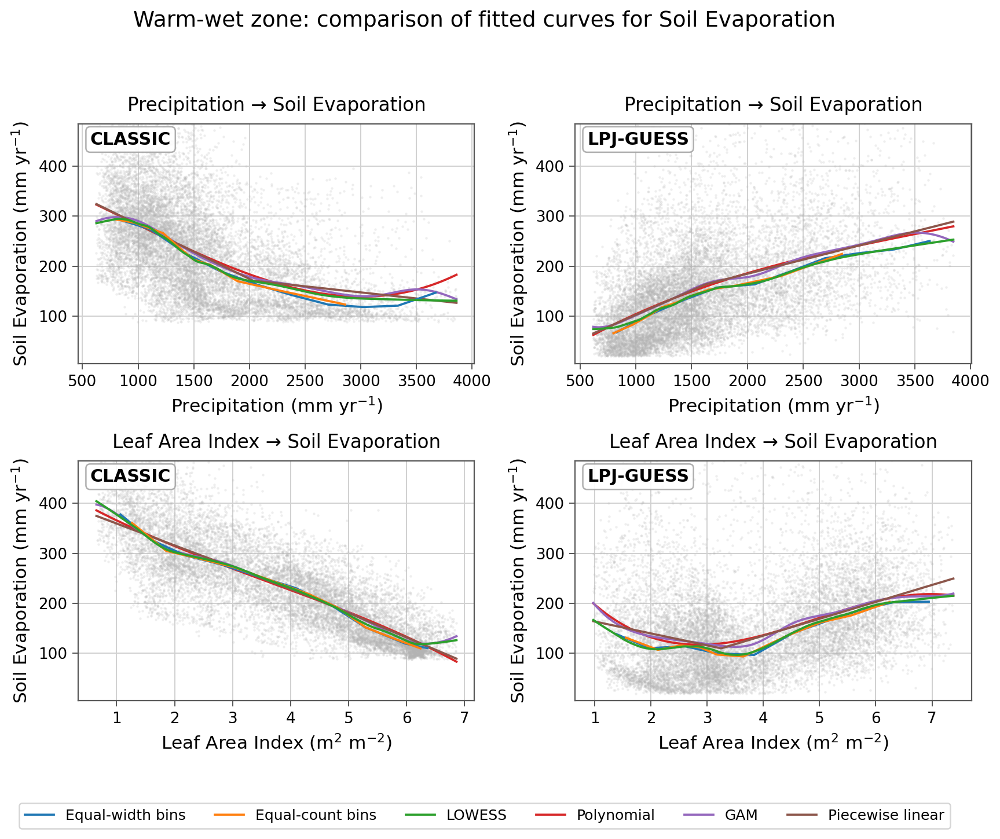

In [57]:
plot_all_fitting_methods_2x2(
    classic_df,
    lpj_df,
    var_map=var_map,
    climate_zone="HW",
    y_label="E_soil",
    n_bins=10,
    frac=0.18,
    poly_degree=3
)

### 计算曲线
1. 计算每个子图的散点和所有拟合曲线
2. 把曲线结果保存到 curve_results
3. 用 curve_results 画 2×2 图
4. 再基于 curve_results 判断每条 curve 的 shape type
5. 输出 classification table

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from scipy.optimize import curve_fit


# =========================================================
# Basic label maps
# =========================================================

full_label_map = {
    "P": "Precipitation (mm yr$^{-1}$)",
    "LAI": "Leaf Area Index (m$^2$ m$^{-2}$)",
    "T": "Transpiration (mm yr$^{-1}$)",
    "ET": "Evapotranspiration (mm yr$^{-1}$)",
    "E_veg": "Vegetation Evaporation (mm yr$^{-1}$)",
    "E_soil": "Soil Evaporation (mm yr$^{-1}$)"
}

short_label_map = {
    "P": "Precipitation",
    "LAI": "Leaf Area Index",
    "T": "Transpiration",
    "ET": "Evapotranspiration",
    "E_veg": "Vegetation Evaporation",
    "E_soil": "Soil Evaporation"
}


# =========================================================
# 1. Equal-width binned median curve
# =========================================================

def compute_equal_width_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return None

    x_min, x_max = np.nanmin(x), np.nanmax(x)

    if x_min == x_max:
        return None

    edges = np.linspace(x_min, x_max, n_bins + 1)

    x_med = []
    y_med = []

    for i in range(n_bins):
        left = edges[i]
        right = edges[i + 1]

        if i == n_bins - 1:
            mask = (x >= left) & (x <= right)
        else:
            mask = (x >= left) & (x < right)

        if np.sum(mask) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[mask]))
        y_med.append(np.nanmedian(y[mask]))

    if len(x_med) < 2:
        return None

    return {
        "x": np.array(x_med),
        "y": np.array(y_med)
    }


# =========================================================
# 2. Equal-count binned median curve
# =========================================================

def compute_equal_count_binned_medians(x, y, n_bins=10, min_count_per_bin=20):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < min_count_per_bin:
        return None

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    bin_indices = np.array_split(np.arange(len(x)), n_bins)

    x_med = []
    y_med = []

    for idx in bin_indices:
        if len(idx) < min_count_per_bin:
            continue

        x_med.append(np.nanmedian(x[idx]))
        y_med.append(np.nanmedian(y[idx]))

    if len(x_med) < 2:
        return None

    return {
        "x": np.array(x_med),
        "y": np.array(y_med)
    }


# =========================================================
# 3. LOWESS curve
# =========================================================

def compute_lowess_curve(x, y, frac=0.18):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return None

    try:
        smoothed = lowess(y, x, frac=frac, return_sorted=True)

        xs = smoothed[:, 0]
        uniq_idx = np.concatenate([[True], np.diff(xs) > 0])
        smoothed = smoothed[uniq_idx]

        if len(smoothed) < 2:
            return None

        return {
            "x": smoothed[:, 0],
            "y": smoothed[:, 1]
        }

    except Exception:
        return None


# =========================================================
# 4. Polynomial regression curve
# =========================================================

def compute_polynomial_curve(x, y, degree=3, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < degree + 2:
        return None

    try:
        x_grid = np.linspace(np.nanmin(x), np.nanmax(x), n_grid)

        poly = PolynomialFeatures(degree=degree, include_bias=False)
        X_poly = poly.fit_transform(x.reshape(-1, 1))

        model = LinearRegression()
        model.fit(X_poly, y)

        y_grid = model.predict(poly.transform(x_grid.reshape(-1, 1)))

        return {
            "x": x_grid,
            "y": y_grid
        }

    except Exception:
        return None


# =========================================================
# 5. GAM curve
# =========================================================

def compute_gam_curve(x, y, n_grid=300, n_splines=12):
    try:
        from pygam import LinearGAM, s
    except ImportError:
        return None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None

    try:
        x_grid = np.linspace(np.nanmin(x), np.nanmax(x), n_grid)

        gam = LinearGAM(s(0, n_splines=n_splines)).fit(
            x.reshape(-1, 1),
            y
        )

        y_grid = gam.predict(x_grid.reshape(-1, 1))

        return {
            "x": x_grid,
            "y": y_grid
        }

    except Exception:
        return None


# =========================================================
# 6. Piecewise linear curve
# =========================================================

def piecewise_linear_one_break(x, x0, k1, k2, b):
    return np.where(
        x < x0,
        k1 * x + b,
        k1 * x0 + b + k2 * (x - x0)
    )


def compute_piecewise_linear_curve(x, y, n_grid=300):
    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 20:
        return None

    try:
        x_min = np.nanmin(x)
        x_max = np.nanmax(x)
        x_grid = np.linspace(x_min, x_max, n_grid)

        p0 = [
            np.nanmedian(x),
            0.0,
            0.0,
            np.nanmedian(y)
        ]

        bounds = (
            [x_min, -np.inf, -np.inf, -np.inf],
            [x_max,  np.inf,  np.inf,  np.inf]
        )

        params, _ = curve_fit(
            piecewise_linear_one_break,
            x,
            y,
            p0=p0,
            bounds=bounds,
            maxfev=20000
        )

        y_grid = piecewise_linear_one_break(x_grid, *params)

        return {
            "x": x_grid,
            "y": y_grid
        }

    except Exception:
        return None


# =========================================================
# 7. Symbolic regression curve
# =========================================================

def compute_symbolic_regression_curve(
    x,
    y,
    n_grid=300,
    max_train=8000,
    random_state=42
):
    try:
        from gplearn.genetic import SymbolicRegressor
    except ImportError:
        return None

    x = np.asarray(x)
    y = np.asarray(y)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 50:
        return None

    try:
        x_grid = np.linspace(np.nanmin(x), np.nanmax(x), n_grid)

        if len(x) > max_train:
            rng = np.random.default_rng(random_state)
            idx = rng.choice(len(x), size=max_train, replace=False)
            x_train = x[idx]
            y_train = y[idx]
        else:
            x_train = x
            y_train = y

        est = SymbolicRegressor(
            population_size=1000,
            generations=15,
            stopping_criteria=0.01,
            p_crossover=0.7,
            p_subtree_mutation=0.1,
            p_hoist_mutation=0.05,
            p_point_mutation=0.1,
            max_samples=0.8,
            verbose=0,
            parsimony_coefficient=0.01,
            random_state=random_state,
            function_set=("add", "sub", "mul", "div", "sqrt", "log")
        )

        est.fit(x_train.reshape(-1, 1), y_train)

        y_grid = est.predict(x_grid.reshape(-1, 1))

        return {
            "x": x_grid,
            "y": y_grid,
            "expression": str(est._program)
        }

    except Exception:
        return None


# =========================================================
# 8. Compute all curves for one x-y relation
# =========================================================

def compute_all_curves_for_relation(
    x,
    y,
    n_bins=10,
    frac=0.18,
    poly_degree=3,
    min_count_per_bin=20
):
    curves = {}

    curves["Equal-width bins"] = compute_equal_width_binned_medians(
        x,
        y,
        n_bins=n_bins,
        min_count_per_bin=min_count_per_bin
    )

    curves["Equal-count bins"] = compute_equal_count_binned_medians(
        x,
        y,
        n_bins=n_bins,
        min_count_per_bin=min_count_per_bin
    )

    curves["LOWESS"] = compute_lowess_curve(
        x,
        y,
        frac=frac
    )

    curves[f"Polynomial degree {poly_degree}"] = compute_polynomial_curve(
        x,
        y,
        degree=poly_degree
    )

    curves["GAM"] = compute_gam_curve(
        x,
        y
    )

    curves["Piecewise linear"] = compute_piecewise_linear_curve(
        x,
        y
    )

    curves["Symbolic regression"] = compute_symbolic_regression_curve(
        x,
        y
    )

    # 去掉没有成功计算的曲线
    curves = {
        method: curve
        for method, curve in curves.items()
        if curve is not None
    }

    return curves


# =========================================================
# 9. Compute all curves for 2 × 2 figure
# =========================================================

def compute_curves_2x2(
    classic_df,
    lpj_df,
    var_map,
    climate_zone="HW",
    y_label="T",
    x_labels=("P", "LAI"),
    n_bins=10,
    frac=0.18,
    poly_degree=3,
    min_count_per_bin=20
):
    model_specs = [
        ("CLASSIC", classic_df),
        ("LPJ-GUESS", lpj_df)
    ]

    curve_results = {}

    for x_label in x_labels:
        for model_name, df in model_specs:
            df_zone = df[df["climate_zone"] == climate_zone].copy()

            x_col = var_map[x_label]
            y_col = var_map[y_label]

            sub = (
                df_zone[[x_col, y_col]]
                .replace([np.inf, -np.inf], np.nan)
                .dropna()
                .copy()
            )

            x = sub[x_col].values
            y = sub[y_col].values

            curves = compute_all_curves_for_relation(
                x,
                y,
                n_bins=n_bins,
                frac=frac,
                poly_degree=poly_degree,
                min_count_per_bin=min_count_per_bin
            )

            curve_results[(x_label, y_label, model_name)] = {
                "x_raw": x,
                "y_raw": y,
                "sub": sub,
                "curves": curves
            }

    return curve_results

In [62]:
def plot_curves_2x2(
    curve_results,
    climate_zone="HW",
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    sample_size=30000,
    point_size=3,
    point_alpha=0.20,
    line_width=1.2
):
    method_styles = {
        "Equal-width bins": {
            "color": "#1f77b4",
            "linestyle": "-"
        },
        "Equal-count bins": {
            "color": "#ff7f0e",
            "linestyle": "-"
        },
        "LOWESS": {
            "color": "#2ca02c",
            "linestyle": "-"
        },
        "Polynomial degree 3": {
            "color": "#d62728",
            "linestyle": "-"
        },
        "GAM": {
            "color": "#9467bd",
            "linestyle": "-"
        },
        "Piecewise linear": {
            "color": "#8c564b",
            "linestyle": "-"
        },
        "Symbolic regression": {
            "color": "#e377c2",
            "linestyle": "-"
        }
    }

    # y-axis limits aligned by row
    y_limits = {}

    for row, x_label in enumerate(x_labels):
        all_y = []

        for model_name in model_names:
            key = (x_label, y_label, model_name)

            if key in curve_results:
                y_raw = curve_results[key]["y_raw"]
                if len(y_raw) > 0:
                    all_y.append(y_raw)

        if len(all_y) > 0:
            y_all = np.concatenate(all_y)
            ymin, ymax = np.nanpercentile(y_all, [1, 99])
            yrange = ymax - ymin

            if yrange == 0:
                yrange = 1

            y_limits[row] = (
                ymin - 0.05 * yrange,
                ymax + 0.05 * yrange
            )

    fig, axes = plt.subplots(
        2,
        2,
        figsize=(12, 8),
        dpi=180
    )

    for row, x_label in enumerate(x_labels):
        for col, model_name in enumerate(model_names):
            ax = axes[row, col]

            key = (x_label, y_label, model_name)

            if key not in curve_results:
                continue

            result = curve_results[key]

            x_raw = result["x_raw"]
            y_raw = result["y_raw"]
            sub = result["sub"]
            curves = result["curves"]

            # Sample points
            if len(sub) > sample_size:
                sub_plot = sub.sample(sample_size, random_state=42)
                x_plot = sub_plot.iloc[:, 0].values
                y_plot = sub_plot.iloc[:, 1].values
            else:
                x_plot = x_raw
                y_plot = y_raw

            ax.scatter(
                x_plot,
                y_plot,
                s=point_size,
                alpha=point_alpha,
                color="0.70",
                linewidths=0,
                zorder=1
            )

            # Plot curves
            for method, curve in curves.items():
                style = method_styles.get(
                    method,
                    {
                        "color": "black",
                        "linestyle": "-"
                    }
                )

                ax.plot(
                    curve["x"],
                    curve["y"],
                    color=style["color"],
                    linestyle=style["linestyle"],
                    linewidth=line_width,
                    label=method,
                    zorder=5
                )

            # Model label
            ax.text(
                0.03,
                0.97,
                model_name,
                transform=ax.transAxes,
                fontsize=12,
                fontweight="bold",
                ha="left",
                va="top",
                bbox=dict(
                    boxstyle="round,pad=0.25",
                    facecolor="white",
                    edgecolor="0.65",
                    alpha=0.90
                ),
                zorder=20
            )

            ax.set_xlabel(full_label_map.get(x_label, x_label), fontsize=12.5)
            ax.set_ylabel(full_label_map.get(y_label, y_label), fontsize=12.5)

            if row in y_limits:
                ax.set_ylim(y_limits[row])

            ax.set_title(
                f"{short_label_map.get(x_label, x_label)} → "
                f"{short_label_map.get(y_label, y_label)}",
                fontsize=13,
                pad=9
            )

            ax.set_facecolor("white")
            ax.set_axisbelow(True)
            ax.grid(
                True,
                which="major",
                color="0.82",
                linestyle="-",
                linewidth=0.8
            )
            ax.minorticks_off()

            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9)
                ax.spines[side].set_color("0.35")

            ax.tick_params(
                axis="both",
                which="major",
                labelsize=10.5,
                length=4,
                width=0.8,
                color="0.35"
            )

    # Legend
    handles, labels = axes[0, 0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        loc="lower center",
        ncol=4,
        frameon=True,
        fontsize=10,
        bbox_to_anchor=(0.5, -0.01)
    )

    fig.suptitle(
        f"{climate_zone} zone: comparison of fitted curves for "
        f"{short_label_map.get(y_label, y_label)}",
        fontsize=15,
        y=0.98
    )

    plt.tight_layout(rect=[0.03, 0.07, 1, 0.94])
    plt.show()

In [77]:
import numpy as np


def classify_curve_shape_v3(
    x_curve,
    y_curve,
    slope_tol=0.03,
    monotonic_fraction=0.80,
    min_net_change_ratio=0.10,
    saturation_ratio=0.50,
    min_saturation_drop=0.20,
    turning_amplitude_ratio=0.15,
    edge_fraction=0.30,
    smooth_window=3
):
    """
    Classify fitted curve shape using a more robust, morphology-based rule.

    Shape types:
    - Monotonic increase
    - Monotonic saturating increase
    - Monotonic decrease
    - Monotonic saturating decrease
    - U-shaped
    - Inverted-U-shaped
    - Complex or uncertain nonlinear

    Main idea:
    1. Determine overall direction.
    2. Detect meaningful turning points.
    3. For mostly monotonic curves, detect saturation by comparing early and late slopes.
    """

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {
            "shape_type": "Insufficient data"
        }

    # Sort by x
    order = np.argsort(x)
    x = x[order]
    y = y[order]

    # Remove duplicated x
    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {
            "shape_type": "Insufficient data"
        }

    # Optional light smoothing for classification stability
    # This only affects classification, not the original plotted curve
    if smooth_window is not None and smooth_window > 1 and len(y) >= smooth_window:
        kernel = np.ones(smooth_window) / smooth_window
        y_smooth = np.convolve(y, kernel, mode="same")

        # keep endpoints closer to original values
        y_smooth[0] = y[0]
        y_smooth[-1] = y[-1]
    else:
        y_smooth = y.copy()

    x_range = np.nanmax(x) - np.nanmin(x)
    y_range = np.nanmax(y_smooth) - np.nanmin(y_smooth)

    if x_range == 0 or y_range == 0:
        return {
            "shape_type": "Flat or no meaningful variation",
            "net_change_ratio": 0.0,
            "pos_fraction": 0.0,
            "neg_fraction": 0.0,
            "n_turning_points": 0
        }

    # Normalize y to 0-1 scale for comparable thresholds
    y_norm = (y_smooth - np.nanmin(y_smooth)) / y_range

    dx = np.diff(x)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    dx = dx[valid_dx]
    dy = dy[valid_dx]

    if len(dx) < 4:
        return {
            "shape_type": "Insufficient data"
        }

    slope = dy / dx
    slope_norm = slope * x_range

    signs = np.zeros_like(slope_norm, dtype=int)
    signs[slope_norm > slope_tol] = 1
    signs[slope_norm < -slope_tol] = -1
    signs[np.abs(slope_norm) <= slope_tol] = 0

    n_segments = len(signs)

    pos_fraction = np.sum(signs == 1) / n_segments
    neg_fraction = np.sum(signs == -1) / n_segments
    flat_fraction = np.sum(signs == 0) / n_segments

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = 0
        last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    # Overall direction
    net_change = y_norm[-1] - y_norm[0]
    net_change_ratio = abs(net_change)

    # Total variation: if too much larger than net change, curve is not simple monotonic
    total_variation = np.sum(np.abs(np.diff(y_norm)))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )

    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # -----------------------------------------------------
    # Meaningful turning point detection
    # -----------------------------------------------------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    # Valley depth for U shape:
    # left side should decrease into the valley,
    # right side should increase out of the valley.
    left_drop_to_min = y_norm[0] - y_norm[min_idx]
    right_rise_from_min = y_norm[-1] - y_norm[min_idx]

    valley_is_internal = 0 < min_idx < len(y_norm) - 1

    u_shape_candidate = (
        valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and first_sign == -1
        and last_sign == 1
    )

    # Peak height for inverted-U:
    # left side should increase into the peak,
    # right side should decrease out of the peak.
    left_rise_to_max = y_norm[max_idx] - y_norm[0]
    right_drop_from_max = y_norm[max_idx] - y_norm[-1]

    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    inverted_u_candidate = (
        peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and first_sign == 1
        and last_sign == -1
    )

    # If multiple sign changes and no clean U/inverted-U, treat as complex
    if n_sign_changes >= 2:
        shape_type = "Complex or uncertain nonlinear"

    elif u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    else:
        # -------------------------------------------------
        # Saturation detection for mostly monotonic curves
        # -------------------------------------------------
        segment_mid_x = (x[:-1] + x[1:]) / 2
        segment_mid_x = segment_mid_x[valid_dx]

        lower_threshold = np.nanmin(x) + edge_fraction * x_range
        upper_threshold = np.nanmin(x) + (1 - edge_fraction) * x_range

        early_mask = segment_mid_x <= lower_threshold
        late_mask = segment_mid_x >= upper_threshold

        if np.sum(early_mask) > 0 and np.sum(late_mask) > 0:
            early_slope = np.nanmedian(slope_norm[early_mask])
            late_slope = np.nanmedian(slope_norm[late_mask])
        else:
            early_slope = np.nan
            late_slope = np.nan

        # For increasing saturation:
        # early slope positive and strong,
        # late slope much smaller,
        # late slope should not be clearly negative.
        increasing_saturation = (
            mostly_increasing
            and np.isfinite(early_slope)
            and np.isfinite(late_slope)
            and early_slope > slope_tol
            and late_slope >= -slope_tol
            and (late_slope / (early_slope + 1e-9)) <= saturation_ratio
            and (early_slope - late_slope) >= min_saturation_drop
        )

        # For decreasing saturation:
        # early slope negative and strong,
        # late slope closer to zero,
        # late slope should not be clearly positive.
        decreasing_saturation = (
            mostly_decreasing
            and np.isfinite(early_slope)
            and np.isfinite(late_slope)
            and early_slope < -slope_tol
            and late_slope <= slope_tol
            and (abs(late_slope) / (abs(early_slope) + 1e-9)) <= saturation_ratio
            and (abs(early_slope) - abs(late_slope)) >= min_saturation_drop
        )

        if increasing_saturation:
            shape_type = "Monotonic saturating increase"

        elif mostly_increasing:
            shape_type = "Monotonic increase"

        elif decreasing_saturation:
            shape_type = "Monotonic saturating decrease"

        elif mostly_decreasing:
            shape_type = "Monotonic decrease"

        else:
            shape_type = "Complex or uncertain nonlinear"

    return {
        "shape_type": shape_type,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,
        "min_idx": min_idx,
        "max_idx": max_idx,
        "left_drop_to_min": left_drop_to_min,
        "right_rise_from_min": right_rise_from_min,
        "left_rise_to_max": left_rise_to_max,
        "right_drop_from_max": right_drop_from_max,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,
        "early_slope": locals().get("early_slope", np.nan),
        "late_slope": locals().get("late_slope", np.nan)
    }

In [78]:
def classify_all_curves_v3(curve_results):
    records = []

    for key, result in curve_results.items():
        x_label, y_label, model_name = key

        curves = result["curves"]

        for method, curve in curves.items():
            shape_result = classify_curve_shape_v3(
                curve["x"],
                curve["y"]
            )

            records.append({
                "model": model_name,
                "x": x_label,
                "y": y_label,
                "method": method,
                "shape_type": shape_result["shape_type"],
                "n_sign_changes": shape_result.get("n_sign_changes", np.nan),
                "pos_fraction": shape_result.get("pos_fraction", np.nan),
                "neg_fraction": shape_result.get("neg_fraction", np.nan),
                "flat_fraction": shape_result.get("flat_fraction", np.nan),
                "net_change": shape_result.get("net_change", np.nan),
                "net_change_ratio": shape_result.get("net_change_ratio", np.nan),
                "roughness_ratio": shape_result.get("roughness_ratio", np.nan),
                "early_slope": shape_result.get("early_slope", np.nan),
                "late_slope": shape_result.get("late_slope", np.nan),
                "u_shape_candidate": shape_result.get("u_shape_candidate", np.nan),
                "inverted_u_candidate": shape_result.get("inverted_u_candidate", np.nan)
            })

    return pd.DataFrame(records)

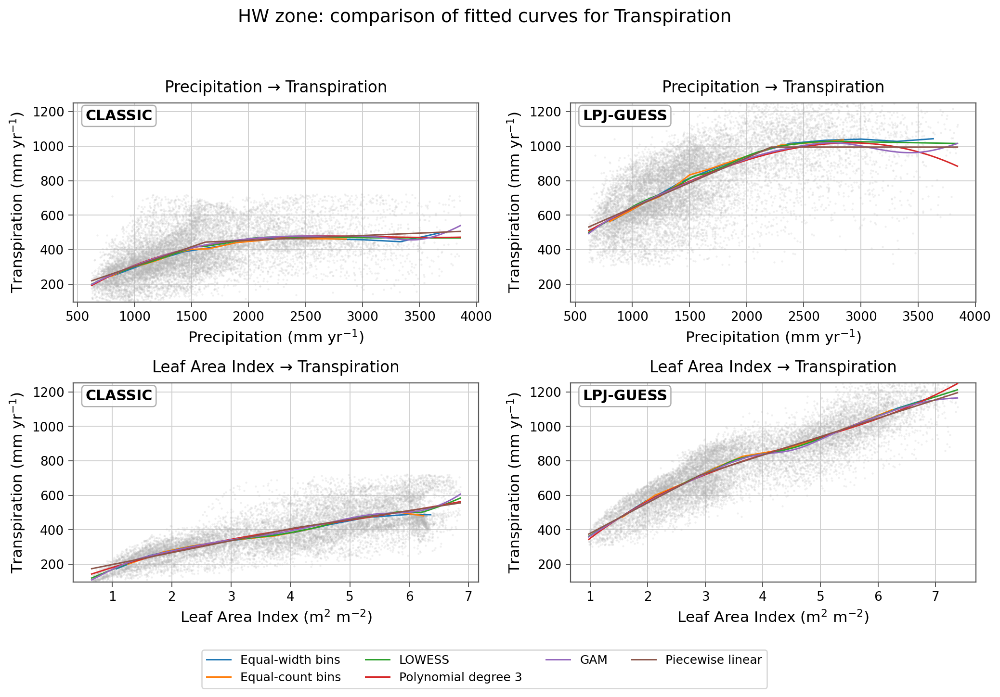

In [79]:
curve_results = compute_curves_2x2(
    classic_df,
    lpj_df,
    var_map=var_map,
    climate_zone="HW",
    y_label="T",
    x_labels=("P", "LAI"),
    n_bins=10,
    frac=0.18,
    poly_degree=3,
    min_count_per_bin=20
)
plot_curves_2x2(
    curve_results,
    climate_zone="HW",
    y_label="T",
    x_labels=("P", "LAI"),
    model_names=("CLASSIC", "LPJ-GUESS"),
    line_width=1.2
)

In [80]:
shape_df_v2 = classify_all_curves_v3(curve_results)
shape_df_v2

,model,x,y,method,shape_type,n_sign_changes,pos_fraction,neg_fraction,flat_fraction,net_change,net_change_ratio,roughness_ratio,early_slope,late_slope,u_shape_candidate,inverted_u_candidate
0,CLASSIC,P,T,Equal-width bins,Complex or uncertain nonlinear,2,0.777778,0.222222,0.000000,1.000000,1.000000,1.075674,NaN,NaN,False,False
1,CLASSIC,P,T,Equal-count bins,Monotonic saturating increase,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,2.187145,0.099829,False,False
2,CLASSIC,P,T,LOWESS,Complex or uncertain nonlinear,9,0.848513,0.090909,0.060578,0.978669,0.978669,1.043815,NaN,NaN,False,False
3,CLASSIC,P,T,Polynomial degree 3,Complex or uncertain nonlinear,2,0.675585,0.267559,0.056856,0.975370,0.975370,1.063583,NaN,NaN,False,False
4,CLASSIC,P,T,GAM,Complex or uncertain nonlinear,2,0.702341,0.217391,0.080268,1.000000,1.000000,1.130858,NaN,NaN,False,False
5,CLASSIC,P,T,Piecewise linear,Monotonic saturating increase,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,2.541910,0.312871,False,False
6,LPJ-GUESS,P,T,Equal-width bins,Monotonic saturating increase,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.898080,0.075881,False,False
7,LPJ-GUESS,P,T,Equal-count bins,Monotonic saturating increase,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.587215,0.381605,False,False
8,LPJ-GUESS,P,T,LOWESS,Complex or uncertain nonlinear,11,0.938128,0.051738,0.010133,0.976877,0.976877,1.047434,NaN,NaN,False,False
9,LPJ-GUESS,P,T,Polynomial degree 3,Inverted-U-shaped,1,0.705686,0.284281,0.010033,0.734218,0.734218,1.723985,NaN,NaN,False,True


In [82]:
import numpy as np


def classify_curve_shape_v5(
    x_curve,
    y_curve,
    y_obs=None,
    y_obs_std=None,
    slope_tol=0.03,
    monotonic_fraction=0.80,
    min_net_change_ratio=0.10,
    flat_response_threshold=0.05,
    saturation_ratio=0.30,
    turning_amplitude_ratio=0.15,
    roughness_threshold=3.0,
    edge_fraction=0.30,
    smooth_window=3
):
    """
    Slope-based morphology classification of fitted response curves.

    Key improvements:
    1. Flat / negligible response is checked before normalization.
    2. Saturation is based on relative early-late slope weakening.
    3. U / inverted-U require exactly one major slope sign change.
    4. Roughness is used to identify complex curves.
    5. Threshold-activated responses are included.
    """

    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    # Light smoothing only for classification stability
    if smooth_window is not None and smooth_window > 1 and len(y) >= smooth_window:
        kernel = np.ones(smooth_window) / smooth_window
        y_smooth = np.convolve(y, kernel, mode="same")
        y_smooth[0] = y[0]
        y_smooth[-1] = y[-1]
    else:
        y_smooth = y.copy()

    x_range = np.nanmax(x) - np.nanmin(x)
    fitted_range = np.nanmax(y_smooth) - np.nanmin(y_smooth)

    if x_range == 0:
        return {"shape_type": "Insufficient data"}

    # -----------------------------------------------------
    # Step 0: Flat / negligible response BEFORE normalization
    # -----------------------------------------------------
    if y_obs_std is None:
        if y_obs is not None:
            y_obs_arr = np.asarray(y_obs, dtype=float)
            y_obs_arr = y_obs_arr[np.isfinite(y_obs_arr)]
            y_obs_std = np.nanstd(y_obs_arr)
        else:
            # fallback: use curve scale, but this is less ideal
            y_obs_std = np.nanstd(y_smooth)

    if y_obs_std is None or not np.isfinite(y_obs_std) or y_obs_std == 0:
        y_obs_std = np.nanstd(y_smooth)

    if y_obs_std is None or not np.isfinite(y_obs_std) or y_obs_std == 0:
        return {
            "shape_type": "Flat / negligible response",
            "fitted_range": fitted_range,
            "y_obs_std": y_obs_std
        }

    relative_fitted_range = fitted_range / y_obs_std

    if relative_fitted_range < flat_response_threshold:
        return {
            "shape_type": "Flat / negligible response",
            "fitted_range": fitted_range,
            "y_obs_std": y_obs_std,
            "relative_fitted_range": relative_fitted_range
        }

    # -----------------------------------------------------
    # Normalize for morphology and slope comparison
    # -----------------------------------------------------
    y_range = fitted_range

    if y_range == 0:
        return {
            "shape_type": "Flat / negligible response",
            "fitted_range": fitted_range,
            "y_obs_std": y_obs_std,
            "relative_fitted_range": relative_fitted_range
        }

    y_norm = (y_smooth - np.nanmin(y_smooth)) / y_range
    x_norm = (x - np.nanmin(x)) / x_range

    dx = np.diff(x_norm)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    dx = dx[valid_dx]
    dy = dy[valid_dx]

    if len(dx) < 4:
        return {"shape_type": "Insufficient data"}

    slopes = dy / dx

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1
    signs[np.abs(slopes) <= slope_tol] = 0

    n_segments = len(signs)

    pos_fraction = np.sum(signs == 1) / n_segments
    neg_fraction = np.sum(signs == -1) / n_segments
    flat_fraction = np.sum(signs == 0) / n_segments

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = 0
        last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    net_change = y_norm[-1] - y_norm[0]
    net_change_ratio = abs(net_change)

    total_variation = np.sum(np.abs(np.diff(y_norm)))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )

    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # Segment midpoints for early / late slope
    segment_mid_x = (x_norm[:-1] + x_norm[1:]) / 2
    segment_mid_x = segment_mid_x[valid_dx]

    early_mask = segment_mid_x <= edge_fraction
    late_mask = segment_mid_x >= (1 - edge_fraction)

    if np.sum(early_mask) > 0:
        early_slope = np.nanmedian(slopes[early_mask])
    else:
        early_slope = np.nan

    if np.sum(late_mask) > 0:
        late_slope = np.nanmedian(slopes[late_mask])
    else:
        late_slope = np.nan

    # -----------------------------------------------------
    # Turning-point metrics
    # -----------------------------------------------------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    valley_is_internal = 0 < min_idx < len(y_norm) - 1
    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    left_drop_to_min = y_norm[0] - y_norm[min_idx]
    right_rise_from_min = y_norm[-1] - y_norm[min_idx]

    left_rise_to_max = y_norm[max_idx] - y_norm[0]
    right_drop_from_max = y_norm[max_idx] - y_norm[-1]

    u_shape_candidate = (
        n_sign_changes == 1
        and valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and first_sign == -1
        and last_sign == 1
    )

    inverted_u_candidate = (
        n_sign_changes == 1
        and peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and first_sign == 1
        and last_sign == -1
    )

    # -----------------------------------------------------
    # Saturating and threshold-activated patterns
    # -----------------------------------------------------
    increasing_saturation = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope > slope_tol
        and late_slope >= -slope_tol
        and (late_slope / (early_slope + 1e-9)) <= saturation_ratio
    )

    decreasing_saturation = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope < -slope_tol
        and late_slope <= slope_tol
        and (abs(late_slope) / (abs(early_slope) + 1e-9)) <= saturation_ratio
    )

    threshold_activated_increase = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and abs(early_slope) <= slope_tol
        and late_slope > slope_tol
        and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
    )

    threshold_activated_decrease = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and abs(early_slope) <= slope_tol
        and late_slope < -slope_tol
        and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
    )

    # -----------------------------------------------------
    # Final priority order
    # -----------------------------------------------------
    if roughness_ratio > roughness_threshold or n_sign_changes >= 2:
        shape_type = "Complex or uncertain nonlinear"

    elif u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    elif increasing_saturation:
        shape_type = "Monotonic saturating increase"

    elif decreasing_saturation:
        shape_type = "Monotonic saturating decrease"

    elif threshold_activated_increase:
        shape_type = "Threshold-activated increase"

    elif threshold_activated_decrease:
        shape_type = "Threshold-activated decrease"

    elif mostly_increasing:
        shape_type = "Monotonic increase"

    elif mostly_decreasing:
        shape_type = "Monotonic decrease"

    else:
        shape_type = "Complex or uncertain nonlinear"

    return {
        "shape_type": shape_type,
        "fitted_range": fitted_range,
        "y_obs_std": y_obs_std,
        "relative_fitted_range": relative_fitted_range,
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "early_slope": early_slope,
        "late_slope": late_slope,
        "roughness_ratio": roughness_ratio,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,
        "increasing_saturation": increasing_saturation,
        "decreasing_saturation": decreasing_saturation,
        "threshold_activated_increase": threshold_activated_increase,
        "threshold_activated_decrease": threshold_activated_decrease
    }

In [83]:
def classify_all_curves_v5(curve_results):
    records = []

    for key, result in curve_results.items():
        x_label, y_label, model_name = key

        curves = result["curves"]
        y_raw = result["y_raw"]

        for method, curve in curves.items():
            shape_result = classify_curve_shape_v5(
                curve["x"],
                curve["y"],
                y_obs=y_raw
            )

            records.append({
                "model": model_name,
                "x": x_label,
                "y": y_label,
                "method": method,
                "shape_type": shape_result.get("shape_type", np.nan),
                "relative_fitted_range": shape_result.get("relative_fitted_range", np.nan),
                "net_change": shape_result.get("net_change", np.nan),
                "pos_fraction": shape_result.get("pos_fraction", np.nan),
                "neg_fraction": shape_result.get("neg_fraction", np.nan),
                "flat_fraction": shape_result.get("flat_fraction", np.nan),
                "n_sign_changes": shape_result.get("n_sign_changes", np.nan),
                "early_slope": shape_result.get("early_slope", np.nan),
                "late_slope": shape_result.get("late_slope", np.nan),
                "roughness_ratio": shape_result.get("roughness_ratio", np.nan),
                "increasing_saturation": shape_result.get("increasing_saturation", np.nan),
                "decreasing_saturation": shape_result.get("decreasing_saturation", np.nan),
                "threshold_activated_increase": shape_result.get("threshold_activated_increase", np.nan),
                "threshold_activated_decrease": shape_result.get("threshold_activated_decrease", np.nan),
            })

    return pd.DataFrame(records)

In [85]:
shape_df_v5 = classify_all_curves_v5(curve_results)

shape_df_v5[
    [
        "model", "x", "method", "shape_type",
        "relative_fitted_range",
        "net_change",
        "pos_fraction",
        "neg_fraction",
        "flat_fraction",
        "n_sign_changes",
        "early_slope",
        "late_slope",
        "roughness_ratio"
    ]
]

,model,x,method,shape_type,relative_fitted_range,net_change,pos_fraction,neg_fraction,flat_fraction,n_sign_changes,early_slope,late_slope,roughness_ratio
0,CLASSIC,P,Equal-width bins,Complex or uncertain nonlinear,1.845239,1.000000,0.777778,0.222222,0.000000,2,1.994118,0.421138,1.075674
1,CLASSIC,P,Equal-count bins,Monotonic saturating increase,1.643261,1.000000,1.000000,0.000000,0.000000,0,2.187145,0.099829,1.000000
2,CLASSIC,P,LOWESS,Complex or uncertain nonlinear,2.092984,0.978669,0.848513,0.090909,0.060578,9,2.872910,-0.030114,1.043815
3,CLASSIC,P,Polynomial degree 3,Complex or uncertain nonlinear,2.187342,0.975370,0.675585,0.267559,0.056856,2,2.617436,-0.116270,1.063583
4,CLASSIC,P,GAM,Complex or uncertain nonlinear,2.602444,1.000000,0.702341,0.217391,0.080268,2,2.226421,-0.026608,1.130858
5,CLASSIC,P,Piecewise linear,Monotonic saturating increase,2.184151,1.000000,1.000000,0.000000,0.000000,0,2.541910,0.312871,1.000000
6,LPJ-GUESS,P,Equal-width bins,Monotonic saturating increase,2.308453,1.000000,1.000000,0.000000,0.000000,0,1.898080,0.075881,1.000000
7,LPJ-GUESS,P,Equal-count bins,Monotonic saturating increase,2.307539,1.000000,1.000000,0.000000,0.000000,0,1.587215,0.381605,1.000000
8,LPJ-GUESS,P,LOWESS,Complex or uncertain nonlinear,2.575242,0.976877,0.938128,0.051738,0.010133,11,2.322952,-0.081660,1.047434
9,LPJ-GUESS,P,Polynomial degree 3,Inverted-U-shaped,2.484801,0.734218,0.705686,0.284281,0.010033,1,2.052945,-0.855696,1.723985


In [86]:
"""
Curve shape classification (v4) — robust, morphology-based rule.

Improvements over v3:
1. Added flat / negligible-response gate using external y_obs_std (BUG fix).
2. Removed scale-dependent `min_saturation_drop`; tightened `saturation_ratio`.
3. U / Inverted-U candidates now explicitly require n_sign_changes == 1.
4. Added Threshold-activated increase / decrease (early-flat, late-steep).
5. Used roughness_ratio as a complementary complexity gate.
6. Each threshold has a documented rationale (see below).

Shape labels:
- Flat / negligible response
- Monotonic increase
- Monotonic saturating increase           (early-steep, late-flat, +)
- Threshold-activated increase            (early-flat, late-steep, +)
- Monotonic decrease
- Monotonic saturating decrease           (early-steep, late-flat, -)
- Threshold-activated decrease            (early-flat, late-steep, -)
- U-shaped
- Inverted-U-shaped
- Complex or uncertain nonlinear
- Insufficient data
"""

import numpy as np


def classify_curve_shape_v6(
    x_curve,
    y_curve,
    y_obs_std=None,
    flat_threshold=0.05,
    slope_tol=0.03,
    monotonic_fraction=0.80,
    min_net_change_ratio=0.10,
    saturation_ratio=0.30,
    turning_amplitude_ratio=0.15,
    edge_fraction=0.30,
    roughness_max=3.0,
    smooth_window=3,
):
    """
    Classify the shape of a fitted curve f̂(x).

    Parameters
    ----------
    x_curve, y_curve : array-like
        Grid points and fitted values of f̂.
    y_obs_std : float, optional
        Std of the observed y in the original (un-fitted) data.
        Used to detect flat / negligible responses. Strongly recommended.
        If None, the flat gate falls back to comparing y_range to its own scale,
        which cannot detect truly flat curves robustly.
    flat_threshold : float
        Threshold on (y_range / y_obs_std). Default 0.05 corresponds to
        f̂ varying by less than 5% of the observation std → no meaningful response.
        Rationale: ~0.25% of observed variance — well below typical Sobol-index
        noise floors.
    slope_tol : float
        Threshold for treating a normalized slope as zero (plateau).
        Default 0.03 in normalized units.
    monotonic_fraction : float
        Minimum (pos+flat) or (neg+flat) fraction for a monotonic verdict.
        Default 0.80 — at least 80% of segments agree on direction.
    min_net_change_ratio : float
        Minimum |net change| in normalized y for a monotonic verdict.
        Default 0.10 — net change at least 10% of full normalized range.
    saturation_ratio : float
        Late-slope / early-slope ratio threshold for saturating shapes.
        Default 0.30 — late slope must be at most 30% of early slope.
        Rationale: typical saturating curves (1−exp(−x), log, …) have
        late slopes well under 30% of early slopes; 0.5 is too lax.
    turning_amplitude_ratio : float
        Minimum amplitude (in normalized y) of each segment around a turning point.
        Default 0.15 — both halves of a U / Inv-U must contribute ≥15% of total range.
    edge_fraction : float
        Fraction of x-range used to define "early" and "late" regions.
        Default 0.30 — first/last 30% of x.
    roughness_max : float
        Max allowed total_variation / |net_change| ratio before forcing Complex.
        Default 3.0 — total path length more than 3× net displacement → too wiggly
        to be a simple monotonic / unimodal shape.
    smooth_window : int
        Light smoothing window for slope estimation only.
        Default 3 — minimal smoothing, preserves endpoints.
    """

    # ---------- 1. Input cleaning ----------
    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x, y = x[valid], y[valid]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    order = np.argsort(x)
    x, y = x[order], y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x, y = x[unique_mask], y[unique_mask]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    # ---------- 2. FLAT GATE (before normalization!) ----------
    # This is the most critical fix from v3.
    y_range_raw = float(np.nanmax(y) - np.nanmin(y))
    x_range = float(np.nanmax(x) - np.nanmin(x))

    if x_range == 0:
        return {"shape_type": "Insufficient data"}

    if y_obs_std is not None and y_obs_std > 0:
        if y_range_raw < flat_threshold * y_obs_std:
            return {
                "shape_type": "Flat / negligible response",
                "y_range_raw": y_range_raw,
                "y_obs_std": y_obs_std,
                "y_range_to_obs_std": y_range_raw / y_obs_std,
            }
    elif y_range_raw == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": 0.0,
        }

    # ---------- 3. Light smoothing for slope stability ----------
    # Use reflect-padding to avoid endpoint artifacts that can introduce
    # spurious sign changes near the boundaries.
    if smooth_window is not None and smooth_window > 1 and len(y) >= smooth_window:
        pad = smooth_window // 2
        y_padded = np.concatenate([y[pad:0:-1], y, y[-2:-pad-2:-1]])
        kernel = np.ones(smooth_window) / smooth_window
        y_smooth = np.convolve(y_padded, kernel, mode="valid")
        # Length-correct: y_smooth should now have len(y) entries
        if len(y_smooth) != len(y):
            # fallback to simple conv if padding mismatched
            y_smooth = np.convolve(y, kernel, mode="same")
    else:
        y_smooth = y.copy()

    # ---------- 4. Normalize y to [0, 1] for comparable thresholds ----------
    y_min = float(np.nanmin(y_smooth))
    y_range = float(np.nanmax(y_smooth) - y_min)

    if y_range == 0:
        return {"shape_type": "Flat / negligible response", "y_range_raw": 0.0}

    y_norm = (y_smooth - y_min) / y_range

    # ---------- 5. Slopes and signs ----------
    dx = np.diff(x)
    dy = np.diff(y_norm)
    valid_dx = dx != 0
    dx, dy = dx[valid_dx], dy[valid_dx]

    if len(dx) < 4:
        return {"shape_type": "Insufficient data"}

    slope = dy / dx
    slope_norm = slope * x_range  # makes slope_tol scale-free

    signs = np.zeros_like(slope_norm, dtype=int)
    signs[slope_norm > slope_tol] = 1
    signs[slope_norm < -slope_tol] = -1

    n_segments = len(signs)
    pos_fraction = float(np.sum(signs == 1) / n_segments)
    neg_fraction = float(np.sum(signs == -1) / n_segments)
    flat_fraction = float(np.sum(signs == 0) / n_segments)

    nonzero_signs = signs[signs != 0]
    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    # ---------- 6. Net change and roughness ----------
    net_change = float(y_norm[-1] - y_norm[0])
    net_change_ratio = abs(net_change)
    total_variation = float(np.sum(np.abs(np.diff(y_norm))))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )
    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # ---------- 7. Turning-point candidates ----------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    left_drop_to_min = float(y_norm[0] - y_norm[min_idx])
    right_rise_from_min = float(y_norm[-1] - y_norm[min_idx])
    valley_is_internal = 0 < min_idx < len(y_norm) - 1

    u_shape_candidate = (
        n_sign_changes == 1
        and valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and first_sign == -1
        and last_sign == 1
    )

    left_rise_to_max = float(y_norm[max_idx] - y_norm[0])
    right_drop_from_max = float(y_norm[max_idx] - y_norm[-1])
    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    inverted_u_candidate = (
        n_sign_changes == 1
        and peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and first_sign == 1
        and last_sign == -1
    )

    # ---------- 8. Early / late slope estimates ----------
    segment_mid_x = ((x[:-1] + x[1:]) / 2)[valid_dx]
    lower_threshold = np.nanmin(x) + edge_fraction * x_range
    upper_threshold = np.nanmin(x) + (1 - edge_fraction) * x_range

    early_mask = segment_mid_x <= lower_threshold
    late_mask = segment_mid_x >= upper_threshold

    if np.sum(early_mask) > 0 and np.sum(late_mask) > 0:
        early_slope = float(np.nanmedian(slope_norm[early_mask]))
        late_slope = float(np.nanmedian(slope_norm[late_mask]))
    else:
        early_slope = late_slope = np.nan

    # ---------- 9. Decision tree ----------
    # Priority: Complex (too rough or too many sign changes)
    #         → U / Inv-U
    #         → Saturating / Threshold-activated
    #         → Plain monotonic
    #         → Complex (fallback)

    # U / Inv-U have small net_change by nature (start ≈ end), so roughness_ratio
    # is not meaningful for them — check those candidates first.
    if u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    # Force Complex only when the curve is genuinely non-monotonic:
    # multiple sign changes AND no dominant direction.
    elif (n_sign_changes >= 2
          and max(pos_fraction, neg_fraction) < 0.85
          and roughness_ratio > roughness_max):
        shape_type = "Complex or uncertain nonlinear"

    else:
        # Saturating: early steep, late flat (and same sign as net change)
        increasing_saturation = (
            mostly_increasing
            and np.isfinite(early_slope) and np.isfinite(late_slope)
            and early_slope > slope_tol
            and late_slope >= -slope_tol
            and (late_slope / (early_slope + 1e-9)) <= saturation_ratio
        )
        decreasing_saturation = (
            mostly_decreasing
            and np.isfinite(early_slope) and np.isfinite(late_slope)
            and early_slope < -slope_tol
            and late_slope <= slope_tol
            and (abs(late_slope) / (abs(early_slope) + 1e-9)) <= saturation_ratio
        )

        # Threshold-activated: early flat, late steep
        threshold_activated_increase = (
            mostly_increasing
            and np.isfinite(early_slope) and np.isfinite(late_slope)
            and abs(early_slope) <= slope_tol
            and late_slope > slope_tol
            and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
        )
        threshold_activated_decrease = (
            mostly_decreasing
            and np.isfinite(early_slope) and np.isfinite(late_slope)
            and abs(early_slope) <= slope_tol
            and late_slope < -slope_tol
            and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
        )

        if increasing_saturation:
            shape_type = "Monotonic saturating increase"
        elif threshold_activated_increase:
            shape_type = "Threshold-activated increase"
        elif mostly_increasing:
            shape_type = "Monotonic increase"
        elif decreasing_saturation:
            shape_type = "Monotonic saturating decrease"
        elif threshold_activated_decrease:
            shape_type = "Threshold-activated decrease"
        elif mostly_decreasing:
            shape_type = "Monotonic decrease"
        else:
            shape_type = "Complex or uncertain nonlinear"

    return {
        "shape_type": shape_type,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,
        "min_idx": min_idx,
        "max_idx": max_idx,
        "left_drop_to_min": left_drop_to_min,
        "right_rise_from_min": right_rise_from_min,
        "left_rise_to_max": left_rise_to_max,
        "right_drop_from_max": right_drop_from_max,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,
        "early_slope": early_slope,
        "late_slope": late_slope,
        "y_range_raw": y_range_raw,
        "y_obs_std": y_obs_std,
    }

In [92]:
"""
Synthetic-data validation for classify_curve_shape_v4.

We construct 11 analytical functions covering every shape category and edge case,
then verify the classifier produces the expected label.
"""

# import numpy as np
# import sys
# sys.path.insert(0, "/home/claude")
# from classify_curve_shape_v4 import classify_curve_shape_v4


def make_curve(func, x_range=(0, 1), n=100, noise=0.0, seed=0):
    """Generate a fitted curve with optional noise."""
    rng = np.random.default_rng(seed)
    x = np.linspace(*x_range, n)
    y = func(x) + noise * rng.standard_normal(n)
    return x, y


# y_obs_std mimics the std of the observed (raw) y data —
# in real ESM use, this is computed from the raw observations, not f̂.
# Here we set it to 1.0 (a reference scale), so y_range_raw < 0.05 → flat.
Y_OBS_STD = 1.0

test_cases = [
    # (name, function, x_range, expected_label)
    ("Linear increase",
     lambda x: 0.5 * x,
     (0, 2),
     "Monotonic increase"),

    ("Linear decrease",
     lambda x: -0.5 * x,
     (0, 2),
     "Monotonic decrease"),

    ("Saturating increase (1 - exp)",
     lambda x: 1 - np.exp(-3 * x),
     (0, 2),
     "Monotonic saturating increase"),

    ("Saturating increase (log)",
     lambda x: np.log(1 + 5 * x),
     (0, 2),
     "Monotonic saturating increase"),

    ("Saturating decrease",
     lambda x: np.exp(-3 * x),
     (0, 2),
     "Monotonic saturating decrease"),

    ("Threshold-activated increase",
     lambda x: np.where(x < 1.0, 0.0, x - 1.0),
     (0, 2),
     "Threshold-activated increase"),

    ("Threshold-activated decrease",
     lambda x: np.where(x < 1.0, 1.0, 1.0 - (x - 1.0)),
     (0, 2),
     "Threshold-activated decrease"),

    ("U-shaped",
     lambda x: (x - 1.0) ** 2,
     (0, 2),
     "U-shaped"),

    ("Inverted-U-shaped",
     lambda x: 1.0 - (x - 1.0) ** 2,
     (0, 2),
     "Inverted-U-shaped"),

    ("Flat (negligible response)",
     lambda x: 0.001 * x,           # range over [0,2] is 0.002, far below 0.05
     (0, 2),
     "Flat / negligible response"),

    ("Complex (sin oscillation)",
     lambda x: np.sin(3 * np.pi * x),
     (0, 2),
     "Complex or uncertain nonlinear"),

    # Edge cases that previously fooled v3:
    ("Monotonic + tiny early dip (should NOT be U)",
     lambda x: x + 0.005 * np.exp(-50 * (x - 0.05) ** 2) * (-1),
     (0, 2),
     "Monotonic increase"),

    ("Nearly flat with weak trend (should be Flat)",
     lambda x: 0.01 * x,            # range = 0.02, < 0.05*1.0
     (0, 2),
     "Flat / negligible response"),
]


def run_tests():
    print(f"{'Test name':<55} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 135)
    n_pass = 0
    n_total = len(test_cases)

    for name, func, xr, expected in test_cases:
        x, y = make_curve(func, x_range=xr, n=120, noise=0.0)
        result = classify_curve_shape_v6(x, y, y_obs_std=Y_OBS_STD)
        got = result["shape_type"]
        ok = "✓" if got == expected else "✗"
        if got == expected:
            n_pass += 1
        print(f"{name:<55} {expected:<35} {got:<35} {ok}")

    print("-" * 135)
    print(f"Pass rate: {n_pass}/{n_total} = {100*n_pass/n_total:.0f}%")
    return n_pass, n_total


def run_noisy_tests():
    """Robustness check: same shapes with noise added."""
    print("\n\n=== Noisy variants (noise = 0.03) ===")
    print(f"{'Test name':<55} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 135)
    n_pass = 0
    n_total = 0

    # only test non-flat, non-tiny shapes (noise would dominate flat)
    for name, func, xr, expected in test_cases:
        if "Flat" in expected or "tiny" in name.lower() or "weak" in name.lower():
            continue
        n_total += 1
        x, y = make_curve(func, x_range=xr, n=120, noise=0.03, seed=42)
        result = classify_curve_shape_v6(x, y, y_obs_std=Y_OBS_STD)
        got = result["shape_type"]
        ok = "✓" if got == expected else "✗"
        if got == expected:
            n_pass += 1
        print(f"{name:<55} {expected:<35} {got:<35} {ok}")

    print("-" * 135)
    print(f"Noisy pass rate: {n_pass}/{n_total} = {100*n_pass/n_total:.0f}%")
    return n_pass, n_total


def run_realistic_tests():
    """Realistic flow: noisy data → GAM-like smooth fit → classify.
    This is how the classifier should be used in practice."""
    print("\n\n=== Realistic flow (noise=0.05, smooth fit before classify) ===")
    print(f"{'Test name':<55} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 135)
    n_pass = 0
    n_total = 0

    for name, func, xr, expected in test_cases:
        if "Flat" in expected or "tiny" in name.lower() or "weak" in name.lower():
            continue
        n_total += 1
        # Generate noisy data
        x_data, y_data = make_curve(func, x_range=xr, n=300, noise=0.05, seed=42)
        # Mimic GAM smoothing: heavy moving average on dense grid
        from numpy.lib.stride_tricks import sliding_window_view
        win = 31  # ~10% of points
        if len(y_data) >= win:
            pad = win // 2
            y_pad = np.concatenate([y_data[pad:0:-1], y_data, y_data[-2:-pad-2:-1]])
            kernel = np.ones(win) / win
            y_fit = np.convolve(y_pad, kernel, mode="valid")
            if len(y_fit) != len(y_data):
                y_fit = np.convolve(y_data, kernel, mode="same")
        else:
            y_fit = y_data
        # Subsample to typical grid density
        x_grid = x_data[::3]
        y_grid = y_fit[::3]
        result = classify_curve_shape_v6(x_grid, y_grid, y_obs_std=Y_OBS_STD)
        got = result["shape_type"]
        ok = "✓" if got == expected else "✗"
        if got == expected:
            n_pass += 1
        print(f"{name:<55} {expected:<35} {got:<35} {ok}")

    print("-" * 135)
    print(f"Realistic pass rate: {n_pass}/{n_total} = {100*n_pass/n_total:.0f}%")
    return n_pass, n_total


if __name__ == "__main__":
    p1, t1 = run_tests()
    p2, t2 = run_noisy_tests()
    p3, t3 = run_realistic_tests()
    print(f"\nOverall: {p1+p2+p3}/{t1+t2+t3} passed")

Test name                                               Expected                            Got                                 OK?
---------------------------------------------------------------------------------------------------------------------------------------
Linear increase                                         Monotonic increase                  Monotonic increase                  ✓
Linear decrease                                         Monotonic decrease                  Monotonic decrease                  ✓
Saturating increase (1 - exp)                           Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating increase (log)                               Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating decrease                                     Monotonic saturating decrease       Monotonic saturating decrease       ✓
Threshold-activated increase                            Threshold-activated increa

In [93]:
"""
Curve shape classification v6 — robust, slope-based morphology rule.

Key features:
1. Flat / negligible-response gate before normalization.
2. Local slopes are used to classify positive, negative, and flat segments.
3. Monotonicity is based on net change + directionally consistent local slopes.
4. Saturation is based on relative weakening of late-range slopes.
5. Threshold-activated responses are included.
6. U / inverted-U require a single major slope sign change and sufficient amplitude.
7. Complex patterns are identified by multiple sign changes or high roughness.
"""

import numpy as np


def classify_curve_shape_v6(
    x_curve,
    y_curve,
    y_obs_std=None,
    flat_threshold=0.05,
    slope_tol=0.03,
    monotonic_fraction=0.80,
    min_net_change_ratio=0.10,
    saturation_ratio=0.30,
    turning_amplitude_ratio=0.15,
    edge_fraction=0.30,
    roughness_max=3.0,
    smooth_window=7,
):
    """
    Classify the shape of a fitted response curve f_hat(x).

    Shape labels:
    - Flat / negligible response
    - Monotonic increase
    - Monotonic saturating increase
    - Threshold-activated increase
    - Monotonic decrease
    - Monotonic saturating decrease
    - Threshold-activated decrease
    - U-shaped
    - Inverted-U-shaped
    - Complex or uncertain nonlinear
    - Insufficient data

    Parameters
    ----------
    x_curve, y_curve : array-like
        Coordinates of the fitted curve.
    y_obs_std : float, optional
        Standard deviation of the observed response variable y.
        Strongly recommended for the flat / negligible-response gate.
    flat_threshold : float
        If fitted_range / y_obs_std < flat_threshold, the response is treated
        as negligible. Default = 0.05.
    slope_tol : float
        Normalized slope threshold for identifying flat local segments.
    monotonic_fraction : float
        Minimum fraction of directionally consistent or flat segments required
        for monotonic classification.
    min_net_change_ratio : float
        Minimum normalized net change required for monotonic classification.
    saturation_ratio : float
        Late-slope / early-slope threshold for saturation.
    turning_amplitude_ratio : float
        Minimum normalized amplitude on both sides of an internal valley or peak.
    edge_fraction : float
        Fraction of x range used to define early and late regions.
    roughness_max : float
        Maximum roughness ratio before a curve is treated as complex.
    smooth_window : int
        Window size for light smoothing used only for slope estimation.
    """

    # -----------------------------------------------------
    # 1. Input cleaning
    # -----------------------------------------------------
    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    x_range = float(np.nanmax(x) - np.nanmin(x))
    y_range_raw = float(np.nanmax(y) - np.nanmin(y))

    if x_range == 0:
        return {"shape_type": "Insufficient data"}

    # -----------------------------------------------------
    # 2. Flat / negligible-response gate before normalization
    # -----------------------------------------------------
    flat_gate_used = y_obs_std is not None and np.isfinite(y_obs_std) and y_obs_std > 0

    if flat_gate_used:
        y_range_to_obs_std = y_range_raw / y_obs_std

        if y_range_to_obs_std < flat_threshold:
            return {
                "shape_type": "Flat / negligible response",
                "y_range_raw": y_range_raw,
                "y_obs_std": y_obs_std,
                "y_range_to_obs_std": y_range_to_obs_std,
                "flat_gate_used": True,
            }

    elif y_range_raw == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": 0.0,
            "y_obs_std": y_obs_std,
            "y_range_to_obs_std": np.nan,
            "flat_gate_used": False,
        }

    # -----------------------------------------------------
    # 3. Light smoothing for slope stability
    # -----------------------------------------------------
    if smooth_window is not None and smooth_window > 1:
        if len(y) <= 15:
            smooth_window_eff = min(3, len(y) if len(y) % 2 == 1 else len(y) - 1)
        else:
            smooth_window_eff = min(
                smooth_window,
                len(y) if len(y) % 2 == 1 else len(y) - 1
            )

        if smooth_window_eff >= 3:
            pad = smooth_window_eff // 2
            kernel = np.ones(smooth_window_eff) / smooth_window_eff
            y_padded = np.pad(y, pad_width=pad, mode="reflect")
            y_smooth = np.convolve(y_padded, kernel, mode="valid")
        else:
            y_smooth = y.copy()
    else:
        smooth_window_eff = 1
        y_smooth = y.copy()

    # -----------------------------------------------------
    # 4. Normalize x and y
    # -----------------------------------------------------
    y_min = float(np.nanmin(y_smooth))
    y_range = float(np.nanmax(y_smooth) - y_min)

    if y_range == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": y_range_raw,
            "y_obs_std": y_obs_std,
            "y_range_to_obs_std": (
                y_range_raw / y_obs_std if flat_gate_used else np.nan
            ),
            "flat_gate_used": flat_gate_used,
        }

    x_norm = (x - np.nanmin(x)) / x_range
    y_norm = (y_smooth - y_min) / y_range

    # -----------------------------------------------------
    # 5. Local slopes and slope signs
    # -----------------------------------------------------
    dx = np.diff(x_norm)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    dx = dx[valid_dx]
    dy = dy[valid_dx]

    if len(dx) < 4:
        return {"shape_type": "Insufficient data"}

    slopes = dy / dx

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1

    n_segments = len(signs)

    pos_fraction = float(np.sum(signs == 1) / n_segments)
    neg_fraction = float(np.sum(signs == -1) / n_segments)
    flat_fraction = float(np.sum(signs == 0) / n_segments)

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = 0
        last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    # -----------------------------------------------------
    # 6. Net change and roughness
    # -----------------------------------------------------
    net_change = float(y_norm[-1] - y_norm[0])
    net_change_ratio = abs(net_change)

    total_variation = float(np.sum(np.abs(np.diff(y_norm))))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )

    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # -----------------------------------------------------
    # 7. Turning-point candidates
    # -----------------------------------------------------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    left_drop_to_min = float(y_norm[0] - y_norm[min_idx])
    right_rise_from_min = float(y_norm[-1] - y_norm[min_idx])
    valley_is_internal = 0 < min_idx < len(y_norm) - 1

    u_shape_candidate = (
        n_sign_changes == 1
        and valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and first_sign == -1
        and last_sign == 1
    )

    left_rise_to_max = float(y_norm[max_idx] - y_norm[0])
    right_drop_from_max = float(y_norm[max_idx] - y_norm[-1])
    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    inverted_u_candidate = (
        n_sign_changes == 1
        and peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and first_sign == 1
        and last_sign == -1
    )

    # -----------------------------------------------------
    # 8. Early and late slope estimates
    # -----------------------------------------------------
    segment_mid_x = ((x_norm[:-1] + x_norm[1:]) / 2)[valid_dx]

    early_mask = segment_mid_x <= edge_fraction
    late_mask = segment_mid_x >= (1 - edge_fraction)

    if np.sum(early_mask) > 0:
        early_slope = float(np.nanmedian(slopes[early_mask]))
    else:
        early_slope = np.nan

    if np.sum(late_mask) > 0:
        late_slope = float(np.nanmedian(slopes[late_mask]))
    else:
        late_slope = np.nan

    # -----------------------------------------------------
    # 9. Saturation and threshold activation
    # -----------------------------------------------------
    increasing_saturation = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope > slope_tol
        and late_slope >= -slope_tol
        and (max(late_slope, 0.0) / (early_slope + 1e-9)) <= saturation_ratio
    )

    decreasing_saturation = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope < -slope_tol
        and late_slope <= slope_tol
        and (abs(late_slope) / (abs(early_slope) + 1e-9)) <= saturation_ratio
    )

    threshold_activated_increase = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and abs(early_slope) <= slope_tol
        and late_slope > slope_tol
        and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
    )

    threshold_activated_decrease = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and abs(early_slope) <= slope_tol
        and late_slope < -slope_tol
        and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
    )

    # -----------------------------------------------------
    # 10. Decision tree
    # -----------------------------------------------------
    if u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    elif (
        n_sign_changes >= 2
        and not (mostly_increasing or mostly_decreasing)
    ):
        shape_type = "Complex or uncertain nonlinear"

    elif (
        roughness_ratio > roughness_max
        and not (mostly_increasing or mostly_decreasing)
    ):
        shape_type = "Complex or uncertain nonlinear"

    elif increasing_saturation:
        shape_type = "Monotonic saturating increase"

    elif threshold_activated_increase:
        shape_type = "Threshold-activated increase"

    elif mostly_increasing:
        shape_type = "Monotonic increase"

    elif decreasing_saturation:
        shape_type = "Monotonic saturating decrease"

    elif threshold_activated_decrease:
        shape_type = "Threshold-activated decrease"

    elif mostly_decreasing:
        shape_type = "Monotonic decrease"

    else:
        shape_type = "Complex or uncertain nonlinear"

    return {
        "shape_type": shape_type,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,
        "min_idx": min_idx,
        "max_idx": max_idx,
        "left_drop_to_min": left_drop_to_min,
        "right_rise_from_min": right_rise_from_min,
        "left_rise_to_max": left_rise_to_max,
        "right_drop_from_max": right_drop_from_max,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,
        "early_slope": early_slope,
        "late_slope": late_slope,
        "increasing_saturation": increasing_saturation,
        "decreasing_saturation": decreasing_saturation,
        "threshold_activated_increase": threshold_activated_increase,
        "threshold_activated_decrease": threshold_activated_decrease,
        "y_range_raw": y_range_raw,
        "y_obs_std": y_obs_std,
        "y_range_to_obs_std": (
            y_range_raw / y_obs_std if flat_gate_used else np.nan
        ),
        "flat_gate_used": flat_gate_used,
        "smooth_window_eff": smooth_window_eff,
    }

In [94]:
# =========================================================
# Synthetic-data validation
# =========================================================

def make_curve(func, x_range=(0, 1), n=100, noise=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x = np.linspace(*x_range, n)
    y = func(x) + noise * rng.standard_normal(n)
    return x, y


Y_OBS_STD = 1.0

test_cases = [
    (
        "Linear increase",
        lambda x: 0.5 * x,
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Linear decrease",
        lambda x: -0.5 * x,
        (0, 2),
        "Monotonic decrease",
    ),
    (
        "Saturating increase (1 - exp)",
        lambda x: 1 - np.exp(-3 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Saturating increase (log)",
        lambda x: np.log(1 + 5 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Saturating decrease",
        lambda x: np.exp(-3 * x),
        (0, 2),
        "Monotonic saturating decrease",
    ),
    (
        "Threshold-activated increase",
        lambda x: np.where(x < 1.0, 0.0, x - 1.0),
        (0, 2),
        "Threshold-activated increase",
    ),
    (
        "Threshold-activated decrease",
        lambda x: np.where(x < 1.0, 1.0, 1.0 - (x - 1.0)),
        (0, 2),
        "Threshold-activated decrease",
    ),
    (
        "U-shaped",
        lambda x: (x - 1.0) ** 2,
        (0, 2),
        "U-shaped",
    ),
    (
        "Inverted-U-shaped",
        lambda x: 1.0 - (x - 1.0) ** 2,
        (0, 2),
        "Inverted-U-shaped",
    ),
    (
        "Flat negligible response",
        lambda x: 0.001 * x,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Complex oscillation",
        lambda x: np.sin(3 * np.pi * x),
        (0, 2),
        "Complex or uncertain nonlinear",
    ),
    (
        "Monotonic plus tiny early dip",
        lambda x: x - 0.005 * np.exp(-50 * (x - 0.05) ** 2),
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Nearly flat weak trend",
        lambda x: 0.01 * x,
        (0, 2),
        "Flat / negligible response",
    ),
]


def run_tests():
    print(f"{'Test name':<55} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 135)

    n_pass = 0
    n_total = len(test_cases)

    for name, func, xr, expected in test_cases:
        x, y = make_curve(func, x_range=xr, n=120, noise=0.0)
        result = classify_curve_shape_v6(
            x,
            y,
            y_obs_std=Y_OBS_STD
        )
        got = result["shape_type"]
        ok = "✓" if got == expected else "✗"

        if got == expected:
            n_pass += 1

        print(f"{name:<55} {expected:<35} {got:<35} {ok}")

    print("-" * 135)
    print(f"Pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return n_pass, n_total


def run_noisy_tests(noise=0.03):
    print(f"\n\n=== Noisy variants noise={noise} ===")
    print(f"{'Test name':<55} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 135)

    n_pass = 0
    n_total = 0

    for name, func, xr, expected in test_cases:
        if "Flat" in expected or "tiny" in name.lower() or "weak" in name.lower():
            continue

        n_total += 1

        x, y = make_curve(
            func,
            x_range=xr,
            n=120,
            noise=noise,
            seed=42
        )

        result = classify_curve_shape_v6(
            x,
            y,
            y_obs_std=Y_OBS_STD
        )

        got = result["shape_type"]
        ok = "✓" if got == expected else "✗"

        if got == expected:
            n_pass += 1

        print(f"{name:<55} {expected:<35} {got:<35} {ok}")

    print("-" * 135)
    print(f"Noisy pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return n_pass, n_total


def run_realistic_tests(noise=0.05):
    """
    Realistic flow:
    noisy data -> smooth fitted curve -> shape classification.
    """
    print(f"\n\n=== Realistic flow noise={noise}, smooth fit before classify ===")
    print(f"{'Test name':<55} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 135)

    n_pass = 0
    n_total = 0

    for name, func, xr, expected in test_cases:
        if "Flat" in expected or "tiny" in name.lower() or "weak" in name.lower():
            continue

        n_total += 1

        x_data, y_data = make_curve(
            func,
            x_range=xr,
            n=300,
            noise=noise,
            seed=42
        )

        # Mimic a smooth fitted response curve.
        win = 31
        pad = win // 2
        kernel = np.ones(win) / win

        y_pad = np.pad(y_data, pad_width=pad, mode="reflect")
        y_fit = np.convolve(y_pad, kernel, mode="valid")

        x_grid = x_data[::3]
        y_grid = y_fit[::3]

        result = classify_curve_shape_v6(
            x_grid,
            y_grid,
            y_obs_std=Y_OBS_STD
        )

        got = result["shape_type"]
        ok = "✓" if got == expected else "✗"

        if got == expected:
            n_pass += 1

        print(f"{name:<55} {expected:<35} {got:<35} {ok}")

    print("-" * 135)
    print(f"Realistic pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return n_pass, n_total


if __name__ == "__main__":
    p1, t1 = run_tests()
    p2, t2 = run_noisy_tests()
    p3, t3 = run_realistic_tests()

    print(f"\nOverall: {p1 + p2 + p3}/{t1 + t2 + t3} passed")

Test name                                               Expected                            Got                                 OK?
---------------------------------------------------------------------------------------------------------------------------------------
Linear increase                                         Monotonic increase                  Monotonic increase                  ✓
Linear decrease                                         Monotonic decrease                  Monotonic decrease                  ✓
Saturating increase (1 - exp)                           Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating increase (log)                               Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating decrease                                     Monotonic saturating decrease       Monotonic saturating decrease       ✓
Threshold-activated increase                            Threshold-activated increa

In [96]:
"""
Curve shape classification v6 — robust, slope-based morphology rule.

Key features:
1. Flat / negligible-response gate before normalization.
2. Local slopes are used to classify positive, negative, and flat segments.
3. Monotonicity is based on net change + directionally consistent local slopes.
4. Saturation is based on relative weakening of late-range slopes.
5. Threshold-activated responses are included.
6. U / inverted-U require a single major slope sign change and sufficient amplitude.
7. Complex patterns are identified by multiple sign changes or high roughness.
8. Includes synthetic and edge-case validation tests.
"""

import numpy as np
import pandas as pd


def classify_curve_shape_v6(
    x_curve,
    y_curve,
    y_obs_std=None,
    flat_threshold=0.05,
    slope_tol=0.03,
    monotonic_fraction=0.80,
    min_net_change_ratio=0.10,
    saturation_ratio=0.30,
    turning_amplitude_ratio=0.15,
    edge_fraction=0.30,
    roughness_max=3.0,
    smooth_window=None,
):
    """
    Classify the shape of a fitted response curve f_hat(x).

    Shape labels:
    - Flat / negligible response
    - Monotonic increase
    - Monotonic saturating increase
    - Threshold-activated increase
    - Monotonic decrease
    - Monotonic saturating decrease
    - Threshold-activated decrease
    - U-shaped
    - Inverted-U-shaped
    - Complex or uncertain nonlinear
    - Insufficient data
    """

    # -----------------------------------------------------
    # 1. Input cleaning
    # -----------------------------------------------------
    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    x_range = float(np.nanmax(x) - np.nanmin(x))
    y_range_raw = float(np.nanmax(y) - np.nanmin(y))

    if x_range == 0:
        return {"shape_type": "Insufficient data"}

    # -----------------------------------------------------
    # 2. Flat / negligible-response gate before normalization
    # -----------------------------------------------------
    flat_gate_used = (
        y_obs_std is not None
        and np.isfinite(y_obs_std)
        and y_obs_std > 0
    )

    if flat_gate_used:
        y_range_to_obs_std = y_range_raw / y_obs_std

        if y_range_to_obs_std < flat_threshold:
            return {
                "shape_type": "Flat / negligible response",
                "y_range_raw": y_range_raw,
                "y_obs_std": y_obs_std,
                "y_range_to_obs_std": y_range_to_obs_std,
                "flat_gate_used": True,
            }

    elif y_range_raw == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": 0.0,
            "y_obs_std": y_obs_std,
            "y_range_to_obs_std": np.nan,
            "flat_gate_used": False,
        }

    # -----------------------------------------------------
    # 3. Light smoothing for slope stability
    # -----------------------------------------------------
    if smooth_window is not None and smooth_window > 1:
        if len(y) <= 15:
            smooth_window_eff = min(
                3,
                len(y) if len(y) % 2 == 1 else len(y) - 1
            )
        else:
            smooth_window_eff = min(
                smooth_window,
                len(y) if len(y) % 2 == 1 else len(y) - 1
            )

        if smooth_window_eff >= 3:
            pad = smooth_window_eff // 2
            kernel = np.ones(smooth_window_eff) / smooth_window_eff
            y_padded = np.pad(y, pad_width=pad, mode="reflect")
            y_smooth = np.convolve(y_padded, kernel, mode="valid")
        else:
            y_smooth = y.copy()
    else:
        smooth_window_eff = 1
        y_smooth = y.copy()

    # -----------------------------------------------------
    # 4. Normalize x and y
    # -----------------------------------------------------
    y_min = float(np.nanmin(y_smooth))
    y_range = float(np.nanmax(y_smooth) - y_min)

    if y_range == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": y_range_raw,
            "y_obs_std": y_obs_std,
            "y_range_to_obs_std": (
                y_range_raw / y_obs_std if flat_gate_used else np.nan
            ),
            "flat_gate_used": flat_gate_used,
        }

    x_norm = (x - np.nanmin(x)) / x_range
    y_norm = (y_smooth - y_min) / y_range

    # -----------------------------------------------------
    # 5. Local slopes and slope signs
    # -----------------------------------------------------
    dx = np.diff(x_norm)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    dx = dx[valid_dx]
    dy = dy[valid_dx]

    if len(dx) < 4:
        return {"shape_type": "Insufficient data"}

    slopes = dy / dx

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1

    n_segments = len(signs)

    pos_fraction = float(np.sum(signs == 1) / n_segments)
    neg_fraction = float(np.sum(signs == -1) / n_segments)
    flat_fraction = float(np.sum(signs == 0) / n_segments)

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = 0
        last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    # -----------------------------------------------------
    # 6. Net change and roughness
    # -----------------------------------------------------
    net_change = float(y_norm[-1] - y_norm[0])
    net_change_ratio = abs(net_change)

    total_variation = float(np.sum(np.abs(np.diff(y_norm))))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )

    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # -----------------------------------------------------
    # 7. Turning-point candidates
    # -----------------------------------------------------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    left_drop_to_min = float(y_norm[0] - y_norm[min_idx])
    right_rise_from_min = float(y_norm[-1] - y_norm[min_idx])
    valley_is_internal = 0 < min_idx < len(y_norm) - 1

    u_shape_candidate = (
        n_sign_changes == 1
        and valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and first_sign == -1
        and last_sign == 1
    )

    left_rise_to_max = float(y_norm[max_idx] - y_norm[0])
    right_drop_from_max = float(y_norm[max_idx] - y_norm[-1])
    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    inverted_u_candidate = (
        n_sign_changes == 1
        and peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and first_sign == 1
        and last_sign == -1
    )

    # -----------------------------------------------------
    # 8. Early and late slope estimates
    # -----------------------------------------------------
    segment_mid_x = ((x_norm[:-1] + x_norm[1:]) / 2)[valid_dx]

    early_mask = segment_mid_x <= edge_fraction
    late_mask = segment_mid_x >= (1 - edge_fraction)

    if np.sum(early_mask) > 0:
        early_slope = float(np.nanmedian(slopes[early_mask]))
    else:
        early_slope = np.nan

    if np.sum(late_mask) > 0:
        late_slope = float(np.nanmedian(slopes[late_mask]))
    else:
        late_slope = np.nan

    # -----------------------------------------------------
    # 9. Saturation and threshold activation
    # -----------------------------------------------------
    increasing_saturation = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope > slope_tol
        and late_slope >= -slope_tol
        and (max(late_slope, 0.0) / (early_slope + 1e-9)) <= saturation_ratio
    )

    decreasing_saturation = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope < -slope_tol
        and late_slope <= slope_tol
        and (abs(late_slope) / (abs(early_slope) + 1e-9)) <= saturation_ratio
    )

    threshold_activated_increase = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and abs(early_slope) <= slope_tol
        and late_slope > slope_tol
        and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
    )

    threshold_activated_decrease = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and abs(early_slope) <= slope_tol
        and late_slope < -slope_tol
        and (abs(early_slope) / (abs(late_slope) + 1e-9)) <= saturation_ratio
    )

    # -----------------------------------------------------
    # 10. Decision tree
    # -----------------------------------------------------
    if u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    elif (
        n_sign_changes >= 2
        and not (mostly_increasing or mostly_decreasing)
    ):
        shape_type = "Complex or uncertain nonlinear"

    elif (
        roughness_ratio > roughness_max
        and not (mostly_increasing or mostly_decreasing)
    ):
        shape_type = "Complex or uncertain nonlinear"

    elif increasing_saturation:
        shape_type = "Monotonic saturating increase"

    elif threshold_activated_increase:
        shape_type = "Threshold-activated increase"

    elif mostly_increasing:
        shape_type = "Monotonic increase"

    elif decreasing_saturation:
        shape_type = "Monotonic saturating decrease"

    elif threshold_activated_decrease:
        shape_type = "Threshold-activated decrease"

    elif mostly_decreasing:
        shape_type = "Monotonic decrease"

    else:
        shape_type = "Complex or uncertain nonlinear"

    return {
        "shape_type": shape_type,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,
        "min_idx": min_idx,
        "max_idx": max_idx,
        "left_drop_to_min": left_drop_to_min,
        "right_rise_from_min": right_rise_from_min,
        "left_rise_to_max": left_rise_to_max,
        "right_drop_from_max": right_drop_from_max,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,
        "early_slope": early_slope,
        "late_slope": late_slope,
        "increasing_saturation": increasing_saturation,
        "decreasing_saturation": decreasing_saturation,
        "threshold_activated_increase": threshold_activated_increase,
        "threshold_activated_decrease": threshold_activated_decrease,
        "y_range_raw": y_range_raw,
        "y_obs_std": y_obs_std,
        "y_range_to_obs_std": (
            y_range_raw / y_obs_std if flat_gate_used else np.nan
        ),
        "flat_gate_used": flat_gate_used,
        "smooth_window_eff": smooth_window_eff,
    }


# =========================================================
# Test data generation
# =========================================================

def make_curve(func, x_range=(0, 1), n=100, noise=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x = np.linspace(*x_range, n)
    y = func(x) + noise * rng.standard_normal(n)
    return x, y


Y_OBS_STD = 1.0


# =========================================================
# Basic test cases
# =========================================================

basic_test_cases = [
    (
        "Linear increase",
        lambda x: 0.5 * x,
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Linear decrease",
        lambda x: -0.5 * x,
        (0, 2),
        "Monotonic decrease",
    ),
    (
        "Saturating increase: 1 - exp(-3x)",
        lambda x: 1 - np.exp(-3 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Saturating increase: log(1 + 5x)",
        lambda x: np.log(1 + 5 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Saturating decrease",
        lambda x: np.exp(-3 * x),
        (0, 2),
        "Monotonic saturating decrease",
    ),
    (
        "Threshold-activated increase",
        lambda x: np.where(x < 1.0, 0.0, x - 1.0),
        (0, 2),
        "Threshold-activated increase",
    ),
    (
        "Threshold-activated decrease",
        lambda x: np.where(x < 1.0, 1.0, 1.0 - (x - 1.0)),
        (0, 2),
        "Threshold-activated decrease",
    ),
    (
        "U-shaped",
        lambda x: (x - 1.0) ** 2,
        (0, 2),
        "U-shaped",
    ),
    (
        "Inverted-U-shaped",
        lambda x: 1.0 - (x - 1.0) ** 2,
        (0, 2),
        "Inverted-U-shaped",
    ),
    (
        "Flat negligible response",
        lambda x: 0.001 * x,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Complex oscillation",
        lambda x: np.sin(3 * np.pi * x),
        (0, 2),
        "Complex or uncertain nonlinear",
    ),
]


# =========================================================
# Edge test cases
# =========================================================

edge_test_cases = [
    (
        "Monotonic plus tiny early dip",
        lambda x: x - 0.005 * np.exp(-50 * (x - 0.05) ** 2),
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Nearly flat weak trend",
        lambda x: 0.01 * x,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Weak saturating increase but not flat",
        lambda x: 0.08 * (1 - np.exp(-3 * x)),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Monotonic increase with small wiggles",
        lambda x: x + 0.03 * np.sin(8 * np.pi * x),
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Shallow U-shaped but meaningful",
        lambda x: 0.20 * (x - 1.0) ** 2,
        (0, 2),
        "U-shaped",
    ),
    (
        "Very shallow U should be flat",
        lambda x: 0.02 * (x - 1.0) ** 2,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Asymmetric U-shaped",
        lambda x: np.where(
            x < 1.0,
            (x - 1.0) ** 2,
            0.35 * (x - 1.0) ** 2
        ),
        (0, 2),
        "U-shaped",
    ),
    (
        "Mild log saturation",
        lambda x: np.log1p(1.5 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Increasing with strong oscillation",
        lambda x: x + 0.20 * np.sin(6 * np.pi * x),
        (0, 2),
        "Complex or uncertain nonlinear",
    ),
    (
        "Late acceleration increase",
        lambda x: x ** 2,
        (0, 2),
        "Threshold-activated increase",
    ),
    (
        "Late acceleration decrease",
        lambda x: 1 - x ** 2,
        (0, 1),
        "Threshold-activated decrease",
    ),
]


all_test_cases = basic_test_cases + edge_test_cases


# =========================================================
# Test runners
# =========================================================

def run_tests(test_cases=all_test_cases):
    rows = []

    print(f"{'Test name':<60} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 140)

    n_pass = 0
    n_total = len(test_cases)

    for name, func, xr, expected in test_cases:
        x, y = make_curve(func, x_range=xr, n=120, noise=0.0)

        result = classify_curve_shape_v6(
            x,
            y,
            y_obs_std=Y_OBS_STD
        )

        got = result["shape_type"]
        ok = got == expected

        if ok:
            n_pass += 1

        print(f"{name:<60} {expected:<35} {got:<35} {'✓' if ok else '✗'}")

        rows.append({
            "test_name": name,
            "expected": expected,
            "got": got,
            "ok": ok,
            **result
        })

    print("-" * 140)
    print(f"Pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return pd.DataFrame(rows)


def run_noisy_tests(test_cases=all_test_cases, noise=0.03):
    rows = []

    print(f"\n\n=== Noisy variants noise={noise} ===")
    print(f"{'Test name':<60} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 140)

    n_pass = 0
    n_total = 0

    for name, func, xr, expected in test_cases:
        # Skip deliberately tiny / flat edge cases under noise,
        # because noise would dominate the signal.
        if "Flat" in expected or "tiny" in name.lower() or "weak trend" in name.lower():
            continue

        n_total += 1

        x, y = make_curve(
            func,
            x_range=xr,
            n=120,
            noise=noise,
            seed=42
        )

        result = classify_curve_shape_v6(
            x,
            y,
            y_obs_std=Y_OBS_STD
        )

        got = result["shape_type"]
        ok = got == expected

        if ok:
            n_pass += 1

        print(f"{name:<60} {expected:<35} {got:<35} {'✓' if ok else '✗'}")

        rows.append({
            "test_name": name,
            "expected": expected,
            "got": got,
            "ok": ok,
            **result
        })

    print("-" * 140)
    print(f"Noisy pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return pd.DataFrame(rows)


def run_realistic_tests(test_cases=all_test_cases, noise=0.05):
    """
    Realistic flow:
    noisy data -> smooth fitted curve -> shape classification.
    """
    rows = []

    print(f"\n\n=== Realistic flow noise={noise}, smooth fit before classify ===")
    print(f"{'Test name':<60} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 140)

    n_pass = 0
    n_total = 0

    for name, func, xr, expected in test_cases:
        # Skip deliberately tiny / flat edge cases under noise,
        # because noise would dominate the signal.
        if "Flat" in expected or "tiny" in name.lower() or "weak trend" in name.lower():
            continue

        n_total += 1

        x_data, y_data = make_curve(
            func,
            x_range=xr,
            n=300,
            noise=noise,
            seed=42
        )

        # Mimic a smooth fitted response curve.
        win = 31
        pad = win // 2
        kernel = np.ones(win) / win

        y_pad = np.pad(y_data, pad_width=pad, mode="reflect")
        y_fit = np.convolve(y_pad, kernel, mode="valid")

        x_grid = x_data[::3]
        y_grid = y_fit[::3]

        result = classify_curve_shape_v6(
            x_grid,
            y_grid,
            y_obs_std=Y_OBS_STD
        )

        got = result["shape_type"]
        ok = got == expected

        if ok:
            n_pass += 1

        print(f"{name:<60} {expected:<35} {got:<35} {'✓' if ok else '✗'}")

        rows.append({
            "test_name": name,
            "expected": expected,
            "got": got,
            "ok": ok,
            **result
        })

    print("-" * 140)
    print(f"Realistic pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return pd.DataFrame(rows)


# =========================================================
# Run all tests
# =========================================================

test_df = run_tests()
noisy_test_df = run_noisy_tests(noise=0.03)
realistic_test_df = run_realistic_tests(noise=0.05)

overall_pass = (
    test_df["ok"].sum()
    + noisy_test_df["ok"].sum()
    + realistic_test_df["ok"].sum()
)

overall_total = (
    len(test_df)
    + len(noisy_test_df)
    + len(realistic_test_df)
)

print(f"\nOverall: {overall_pass}/{overall_total} passed")

Test name                                                    Expected                            Got                                 OK?
--------------------------------------------------------------------------------------------------------------------------------------------
Linear increase                                              Monotonic increase                  Monotonic increase                  ✓
Linear decrease                                              Monotonic decrease                  Monotonic decrease                  ✓
Saturating increase: 1 - exp(-3x)                            Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating increase: log(1 + 5x)                             Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating decrease                                          Monotonic saturating decrease       Monotonic saturating decrease       ✓
Threshold-activated increase                   

In [106]:
"""
Curve shape classification — slope-based morphology rule.

Shape labels:
- Flat / negligible response
- Monotonic increase
- Monotonic saturating increase
- Monotonic decrease
- Monotonic saturating decrease
- U-shaped
- Inverted-U-shaped
- Complex or uncertain nonlinear
- Insufficient data
"""

import numpy as np
import pandas as pd


def classify_curve_shape(
    x_curve,
    y_curve,
    y_obs_std=None,
    flat_threshold=0.05,
    slope_tol=0.03,
    monotonic_fraction=0.80,
    min_net_change_ratio=0.10,
    saturation_ratio=0.30,
    turning_amplitude_ratio=0.15,
    edge_fraction=0.30,
    roughness_max=3.0,
):
    """
    Classify the shape of a fitted response curve.

    Parameters
    ----------
    x_curve, y_curve : array-like
        Coordinates of the fitted curve.
    y_obs_std : float, optional
        Standard deviation of the original observed response variable y.
        Strongly recommended for detecting flat / negligible responses.
    flat_threshold : float
        If fitted_range / y_obs_std < flat_threshold, the curve is treated
        as a negligible response.
    slope_tol : float
        Threshold for treating a normalized local slope as flat.
    monotonic_fraction : float
        Minimum fraction of direction-consistent or flat segments required
        for monotonic classification.
    min_net_change_ratio : float
        Minimum normalized net change required for monotonic classification.
    saturation_ratio : float
        Late-slope / early-slope threshold for saturation.
    turning_amplitude_ratio : float
        Minimum normalized amplitude on both sides of a valley or peak.
    edge_fraction : float
        Fraction of x range used to define early and late regions.
    roughness_max : float
        If roughness_ratio is larger than this and no monotonic direction
        dominates, the curve is classified as complex.
    """

    # -----------------------------------------------------
    # 1. Input cleaning
    # -----------------------------------------------------
    x = np.asarray(x_curve, dtype=float)
    y = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    unique_mask = np.concatenate([[True], np.diff(x) > 0])
    x = x[unique_mask]
    y = y[unique_mask]

    if len(x) < 5:
        return {"shape_type": "Insufficient data"}

    x_range = float(np.nanmax(x) - np.nanmin(x))
    y_range_raw = float(np.nanmax(y) - np.nanmin(y))

    if x_range == 0:
        return {"shape_type": "Insufficient data"}

    # -----------------------------------------------------
    # 2. Flat / negligible-response gate before normalization
    # -----------------------------------------------------
    flat_gate_used = (
        y_obs_std is not None
        and np.isfinite(y_obs_std)
        and y_obs_std > 0
    )

    if flat_gate_used:
        y_range_to_obs_std = y_range_raw / y_obs_std

        if y_range_to_obs_std < flat_threshold:
            return {
                "shape_type": "Flat / negligible response",
                "y_range_raw": y_range_raw,
                "y_obs_std": y_obs_std,
                "y_range_to_obs_std": y_range_to_obs_std,
                "flat_gate_used": True,
            }

    elif y_range_raw == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": 0.0,
            "y_obs_std": y_obs_std,
            "y_range_to_obs_std": np.nan,
            "flat_gate_used": False,
        }

    # -----------------------------------------------------
    # 3. Normalize x and y
    # -----------------------------------------------------
    y_min = float(np.nanmin(y))
    y_range = float(np.nanmax(y) - y_min)

    if y_range == 0:
        return {
            "shape_type": "Flat / negligible response",
            "y_range_raw": y_range_raw,
            "y_obs_std": y_obs_std,
            "y_range_to_obs_std": (
                y_range_raw / y_obs_std if flat_gate_used else np.nan
            ),
            "flat_gate_used": flat_gate_used,
        }

    x_norm = (x - np.nanmin(x)) / x_range
    y_norm = (y - y_min) / y_range

    # -----------------------------------------------------
    # 4. Local slopes and slope signs
    # -----------------------------------------------------
    dx = np.diff(x_norm)
    dy = np.diff(y_norm)

    valid_dx = dx != 0
    dx = dx[valid_dx]
    dy = dy[valid_dx]

    if len(dx) < 4:
        return {"shape_type": "Insufficient data"}

    slopes = dy / dx

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1

    n_segments = len(signs)

    pos_fraction = float(np.sum(signs == 1) / n_segments)
    neg_fraction = float(np.sum(signs == -1) / n_segments)
    flat_fraction = float(np.sum(signs == 0) / n_segments)

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) == 0:
        n_sign_changes = 0
        first_sign = 0
        last_sign = 0
    else:
        n_sign_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))
        first_sign = int(nonzero_signs[0])
        last_sign = int(nonzero_signs[-1])

    # -----------------------------------------------------
    # 5. Net change and roughness
    # -----------------------------------------------------
    net_change = float(y_norm[-1] - y_norm[0])
    net_change_ratio = abs(net_change)

    total_variation = float(np.sum(np.abs(np.diff(y_norm))))
    roughness_ratio = total_variation / (abs(net_change) + 1e-9)

    mostly_increasing = (
        net_change > min_net_change_ratio
        and pos_fraction + flat_fraction >= monotonic_fraction
    )

    mostly_decreasing = (
        net_change < -min_net_change_ratio
        and neg_fraction + flat_fraction >= monotonic_fraction
    )

    # -----------------------------------------------------
    # 6. Turning-point candidates
    # -----------------------------------------------------
    min_idx = int(np.argmin(y_norm))
    max_idx = int(np.argmax(y_norm))

    left_drop_to_min = float(y_norm[0] - y_norm[min_idx])
    right_rise_from_min = float(y_norm[-1] - y_norm[min_idx])
    valley_is_internal = 0 < min_idx < len(y_norm) - 1

    u_shape_candidate = (
        n_sign_changes == 1
        and valley_is_internal
        and left_drop_to_min >= turning_amplitude_ratio
        and right_rise_from_min >= turning_amplitude_ratio
        and first_sign == -1
        and last_sign == 1
    )

    left_rise_to_max = float(y_norm[max_idx] - y_norm[0])
    right_drop_from_max = float(y_norm[max_idx] - y_norm[-1])
    peak_is_internal = 0 < max_idx < len(y_norm) - 1

    inverted_u_candidate = (
        n_sign_changes == 1
        and peak_is_internal
        and left_rise_to_max >= turning_amplitude_ratio
        and right_drop_from_max >= turning_amplitude_ratio
        and first_sign == 1
        and last_sign == -1
    )

    # -----------------------------------------------------
    # 7. Early and late slope estimates
    # -----------------------------------------------------
    segment_mid_x = ((x_norm[:-1] + x_norm[1:]) / 2)[valid_dx]

    early_mask = segment_mid_x <= edge_fraction
    late_mask = segment_mid_x >= (1 - edge_fraction)

    if np.sum(early_mask) > 0:
        early_slope = float(np.nanmedian(slopes[early_mask]))
    else:
        early_slope = np.nan

    if np.sum(late_mask) > 0:
        late_slope = float(np.nanmedian(slopes[late_mask]))
    else:
        late_slope = np.nan

    # -----------------------------------------------------
    # 8. Saturation
    # -----------------------------------------------------
    increasing_saturation = (
        mostly_increasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope > slope_tol
        and late_slope >= -slope_tol
        and (max(late_slope, 0.0) / (early_slope + 1e-9)) <= saturation_ratio
    )

    decreasing_saturation = (
        mostly_decreasing
        and np.isfinite(early_slope)
        and np.isfinite(late_slope)
        and early_slope < -slope_tol
        and late_slope <= slope_tol
        and (abs(late_slope) / (abs(early_slope) + 1e-9)) <= saturation_ratio
    )

    # -----------------------------------------------------
    # 9. Decision tree
    # -----------------------------------------------------
    if u_shape_candidate:
        shape_type = "U-shaped"

    elif inverted_u_candidate:
        shape_type = "Inverted-U-shaped"

    elif (
        n_sign_changes >= 2
        and not (mostly_increasing or mostly_decreasing)
    ):
        shape_type = "Complex or uncertain nonlinear"

    elif (
        roughness_ratio > roughness_max
        and not (mostly_increasing or mostly_decreasing)
    ):
        shape_type = "Complex or uncertain nonlinear"

    elif increasing_saturation:
        shape_type = "Monotonic saturating increase"

    elif mostly_increasing:
        shape_type = "Monotonic increase"

    elif decreasing_saturation:
        shape_type = "Monotonic saturating decrease"

    elif mostly_decreasing:
        shape_type = "Monotonic decrease"

    else:
        shape_type = "Complex or uncertain nonlinear"

    return {
        "shape_type": shape_type,
        "n_sign_changes": n_sign_changes,
        "first_sign": first_sign,
        "last_sign": last_sign,
        "pos_fraction": pos_fraction,
        "neg_fraction": neg_fraction,
        "flat_fraction": flat_fraction,
        "net_change": net_change,
        "net_change_ratio": net_change_ratio,
        "total_variation": total_variation,
        "roughness_ratio": roughness_ratio,
        "min_idx": min_idx,
        "max_idx": max_idx,
        "left_drop_to_min": left_drop_to_min,
        "right_rise_from_min": right_rise_from_min,
        "left_rise_to_max": left_rise_to_max,
        "right_drop_from_max": right_drop_from_max,
        "u_shape_candidate": u_shape_candidate,
        "inverted_u_candidate": inverted_u_candidate,
        "early_slope": early_slope,
        "late_slope": late_slope,
        "increasing_saturation": increasing_saturation,
        "decreasing_saturation": decreasing_saturation,
        "y_range_raw": y_range_raw,
        "y_obs_std": y_obs_std,
        "y_range_to_obs_std": (
            y_range_raw / y_obs_std if flat_gate_used else np.nan
        ),
        "flat_gate_used": flat_gate_used,
    }


# =========================================================
# Test data generation
# =========================================================

def make_curve(func, x_range=(0, 1), n=100, noise=0.0, seed=0):
    rng = np.random.default_rng(seed)
    x = np.linspace(*x_range, n)
    y = func(x) + noise * rng.standard_normal(n)
    return x, y


Y_OBS_STD = 1.0


basic_test_cases = [
    (
        "Linear increase",
        lambda x: 0.5 * x,
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Linear decrease",
        lambda x: -0.5 * x,
        (0, 2),
        "Monotonic decrease",
    ),
    (
        "Saturating increase: 1 - exp(-3x)",
        lambda x: 1 - np.exp(-3 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Saturating increase: log(1 + 5x)",
        lambda x: np.log(1 + 5 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Saturating decrease",
        lambda x: np.exp(-3 * x),
        (0, 2),
        "Monotonic saturating decrease",
    ),
    (
        "U-shaped",
        lambda x: (x - 1.0) ** 2,
        (0, 2),
        "U-shaped",
    ),
    (
        "Inverted-U-shaped",
        lambda x: 1.0 - (x - 1.0) ** 2,
        (0, 2),
        "Inverted-U-shaped",
    ),
    (
        "Flat negligible response",
        lambda x: 0.001 * x,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Complex oscillation",
        lambda x: np.sin(3 * np.pi * x),
        (0, 2),
        "Complex or uncertain nonlinear",
    ),
]


edge_test_cases = [
    (
        "Monotonic plus tiny early dip",
        lambda x: x - 0.005 * np.exp(-50 * (x - 0.05) ** 2),
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Nearly flat weak trend",
        lambda x: 0.01 * x,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Weak saturating increase but not flat",
        lambda x: 0.08 * (1 - np.exp(-3 * x)),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Monotonic increase with small wiggles",
        lambda x: x + 0.03 * np.sin(8 * np.pi * x),
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Shallow U-shaped but meaningful",
        lambda x: 0.20 * (x - 1.0) ** 2,
        (0, 2),
        "U-shaped",
    ),
    (
        "Very shallow U should be flat",
        lambda x: 0.02 * (x - 1.0) ** 2,
        (0, 2),
        "Flat / negligible response",
    ),
    (
        "Asymmetric U-shaped",
        lambda x: np.where(
            x < 1.0,
            (x - 1.0) ** 2,
            0.35 * (x - 1.0) ** 2
        ),
        (0, 2),
        "U-shaped",
    ),
    (
        "Mild log saturation",
        lambda x: np.log1p(1.5 * x),
        (0, 2),
        "Monotonic saturating increase",
    ),
    (
        "Increasing with strong oscillation",
        lambda x: x + 0.20 * np.sin(6 * np.pi * x),
        (0, 2),
        "Complex or uncertain nonlinear",
    ),
    (
        "Late acceleration increase",
        lambda x: x ** 2,
        (0, 2),
        "Monotonic increase",
    ),
    (
        "Late acceleration decrease",
        lambda x: 1 - x ** 2,
        (0, 1),
        "Monotonic decrease",
    ),
]


all_test_cases = basic_test_cases + edge_test_cases


def run_tests(test_cases=all_test_cases):
    rows = []

    print(f"{'Test name':<60} {'Expected':<35} {'Got':<35} {'OK?'}")
    print("-" * 140)

    n_pass = 0
    n_total = len(test_cases)

    for name, func, xr, expected in test_cases:
        x, y = make_curve(func, x_range=xr, n=120, noise=0.0)

        result = classify_curve_shape(
            x,
            y,
            y_obs_std=Y_OBS_STD
        )

        got = result["shape_type"]
        ok = got == expected

        if ok:
            n_pass += 1

        print(f"{name:<60} {expected:<35} {got:<35} {'✓' if ok else '✗'}")

        rows.append({
            "test_name": name,
            "expected": expected,
            "got": got,
            "ok": ok,
            **result
        })

    print("-" * 140)
    print(f"Pass rate: {n_pass}/{n_total} = {100 * n_pass / n_total:.0f}%")

    return pd.DataFrame(rows)


test_df = run_tests()

Test name                                                    Expected                            Got                                 OK?
--------------------------------------------------------------------------------------------------------------------------------------------
Linear increase                                              Monotonic increase                  Monotonic increase                  ✓
Linear decrease                                              Monotonic decrease                  Monotonic decrease                  ✓
Saturating increase: 1 - exp(-3x)                            Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating increase: log(1 + 5x)                             Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating decrease                                          Monotonic saturating decrease       Monotonic saturating decrease       ✓
U-shaped                                       

In [107]:
import numpy as np
import matplotlib.pyplot as plt
import math


def plot_test_cases(
    test_cases=all_test_cases,
    classifier=classify_curve_shape,
    y_obs_std=Y_OBS_STD,
    n=120,
    n_cols=3,
    figsize_per_panel=(4.6, 3.4),
    noise=0.0,
    seed=42
):
    """
    Plot synthetic test curves and show classification results.

    Parameters
    ----------
    test_cases : list
        List of tuples: (name, function, x_range, expected_label).
    classifier : function
        Shape classification function.
    y_obs_std : float
        Reference std for flat / negligible response detection.
    n : int
        Number of points for each synthetic curve.
    n_cols : int
        Number of columns in the figure.
    figsize_per_panel : tuple
        Width and height per subplot.
    noise : float
        Optional Gaussian noise added to synthetic curve.
    seed : int
        Random seed for noise.
    """

    n_cases = len(test_cases)
    n_rows = math.ceil(n_cases / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(figsize_per_panel[0] * n_cols, figsize_per_panel[1] * n_rows),
        dpi=160
    )

    axes = np.asarray(axes).reshape(-1)

    for i, (name, func, xr, expected) in enumerate(test_cases):
        ax = axes[i]

        x, y = make_curve(
            func,
            x_range=xr,
            n=n,
            noise=noise,
            seed=seed
        )

        result = classifier(
            x,
            y,
            y_obs_std=y_obs_std
        )

        got = result.get("shape_type", "NA")
        ok = got == expected

        # Main curve
        ax.plot(
            x,
            y,
            linewidth=2.0,
            color="black",
            zorder=3
        )

        # Scatter points, useful when noise > 0
        if noise > 0:
            ax.scatter(
                x,
                y,
                s=8,
                alpha=0.35,
                color="0.45",
                linewidths=0,
                zorder=2
            )

        # Mark min / max for visual check
        if np.all(np.isfinite(y)):
            min_idx = np.argmin(y)
            max_idx = np.argmax(y)

            ax.scatter(
                x[min_idx],
                y[min_idx],
                s=35,
                marker="v",
                color="tab:blue",
                zorder=5,
                label="min"
            )

            ax.scatter(
                x[max_idx],
                y[max_idx],
                s=35,
                marker="^",
                color="tab:red",
                zorder=5,
                label="max"
            )

        # Text box
        metric_text = (
            f"Expected: {expected}\n"
            f"Got: {got}\n"
            f"OK: {'Yes' if ok else 'No'}\n"
            f"net_change = {result.get('net_change', np.nan):.2f}\n"
            f"sign_changes = {result.get('n_sign_changes', np.nan)}\n"
            f"early_slope = {result.get('early_slope', np.nan):.2f}\n"
            f"late_slope = {result.get('late_slope', np.nan):.2f}"
        )

        ax.text(
            0.03,
            0.97,
            metric_text,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=8.2,
            bbox=dict(
                boxstyle="round,pad=0.25",
                facecolor="white",
                edgecolor="0.65",
                alpha=0.90
            ),
            zorder=10
        )

        ax.set_title(
            name,
            fontsize=10.5,
            pad=8,
            color="black" if ok else "crimson"
        )

        ax.set_xlabel("x", fontsize=9.5)
        ax.set_ylabel("fitted response", fontsize=9.5)

        ax.grid(
            True,
            which="major",
            color="0.85",
            linewidth=0.7
        )

        for side in ["top", "right", "bottom", "left"]:
            ax.spines[side].set_visible(True)
            ax.spines[side].set_linewidth(0.8)
            ax.spines[side].set_color("0.35")

        ax.tick_params(
            axis="both",
            labelsize=8.5,
            length=3,
            width=0.7,
            color="0.35"
        )

    # Hide unused axes
    for j in range(n_cases, len(axes)):
        axes[j].axis("off")

    title = "Synthetic curve-shape test cases"
    if noise > 0:
        title += f" with noise = {noise}"

    fig.suptitle(
        title,
        fontsize=15,
        y=0.995
    )

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

In [108]:
plot_test_cases(
    test_cases=all_test_cases,
    noise=0.0,
    n_cols=3
)

In [105]:
noisy_test_df = run_noisy_tests(noise=0.0)



=== Noisy variants noise=0.0 ===
Test name                                                    Expected                            Got                                 OK?
--------------------------------------------------------------------------------------------------------------------------------------------
Linear increase                                              Monotonic increase                  Monotonic increase                  ✓
Linear decrease                                              Monotonic decrease                  Monotonic decrease                  ✓
Saturating increase: 1 - exp(-3x)                            Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating increase: log(1 + 5x)                             Monotonic saturating increase       Monotonic saturating increase       ✓
Saturating decrease                                          Monotonic saturating decrease       Monotonic saturating decrease       ✓
Threshold-ac

In [ ]:
plot_test_cases(
    test_cases=all_test_cases,
    noise=0.03,
    n_cols=3
)

In [ ]:
def classify_all_curves(curve_results):
    records = []

    for key, result in curve_results.items():
        x_label, y_label, model_name = key

        y_raw = result["y_raw"]
        y_obs_std = np.nanstd(y_raw)

        for method, curve in result["curves"].items():
            shape_result = classify_curve_shape(
                curve["x"],
                curve["y"],
                y_obs_std=y_obs_std
            )

            records.append({
                "model": model_name,
                "x": x_label,
                "y": y_label,
                "method": method,
                "shape_type": shape_result.get("shape_type", np.nan),
                "y_range_to_obs_std": shape_result.get("y_range_to_obs_std", np.nan),
                "net_change": shape_result.get("net_change", np.nan),
                "pos_fraction": shape_result.get("pos_fraction", np.nan),
                "neg_fraction": shape_result.get("neg_fraction", np.nan),
                "flat_fraction": shape_result.get("flat_fraction", np.nan),
                "n_sign_changes": shape_result.get("n_sign_changes", np.nan),
                "early_slope": shape_result.get("early_slope", np.nan),
                "late_slope": shape_result.get("late_slope", np.nan),
                "roughness_ratio": shape_result.get("roughness_ratio", np.nan),
                "flat_gate_used": shape_result.get("flat_gate_used", np.nan),
            })

    return pd.DataFrame(records)

In [100]:
shape_df = classify_all_curves(curve_results)

shape_summary = shape_df.pivot_table(
    index=["x", "model"],
    columns="method",
    values="shape_type",
    aggfunc="first"
)

shape_summary

KeyError: 'plateau_near_upper_end'

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D

# 1. 读取数据
data_dir = Path("./preprocessed/preprocessed_with_zones")

classic_df = pd.read_csv(data_dir / "classic_with_climate_zones_filtered_30yr_mean.csv")
lpj_df = pd.read_csv(data_dir / "lpj_guess_with_climate_zones_filtered_30yr_mean.csv")

# 2. 颜色
zone_colors = {
    "HW": "#F27D7A",
    "HD": "#EFD447",
    "CW": "#95D98C",
    "CD": "#73AEEB",
    "Unknown": "#BFBFBF",
}

zone_labels = {
    "HW": "WW - Warm-Wet",
    "HD": "WD - Warm-Dry",
    "CW": "CW - Cold-Wet",
    "CD": "CD - Cold-Dry",
    "Unknown": "Unknown",
}

# 3. 单张地图函数
def plot_zones_map(df, model_name, point_size=3, alpha=0.6):
    fig = plt.figure(figsize=(12, 6), dpi=180)
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()

    ax.add_feature(cfeature.OCEAN, facecolor="white", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.LAND, facecolor="#f5f5f5", edgecolor="none", zorder=0)
    ax.coastlines(linewidth=0.4, color="black", zorder=1)
    ax.add_feature(cfeature.BORDERS, linewidth=0.2, edgecolor="gray", zorder=1)

    ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,
        linewidth=0.3,
        color="0.75",
        alpha=0.6,
        linestyle="-",
        zorder=1
    )

    legend_handles = []

    for zone in ["HW", "HD", "CW", "CD", "Unknown"]:
        sub = df[df["climate_zone"] == zone]
        if len(sub) == 0:
            continue

        ax.scatter(
            sub["lon"],
            sub["lat"],
            s=point_size,
            color=zone_colors[zone],
            alpha=alpha,
            linewidth=0,
            transform=ccrs.PlateCarree(),
            zorder=2
        )

        legend_handles.append(
            Line2D(
                [0], [0],
                marker="o",
                color="none",
                markerfacecolor=zone_colors[zone],
                markeredgecolor="none",
                markersize=6,
                label=f"{zone_labels[zone]} ({len(sub):,})"
            )
        )

    ax.legend(
        handles=legend_handles,
        loc="lower left",
        fontsize=8,
        frameon=True,
        framealpha=1,
        facecolor="white",
        edgecolor="0.6"
    )

    ax.set_title(f"{model_name}: climate-zone samples after removing P = 0", fontsize=12, pad=8)
    plt.show()

# 4. 分别画
plot_zones_map(classic_df, "CLASSIC")
plot_zones_map(lpj_df, "LPJ-GUESS")

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.lines import Line2D

# 1. 读取数据
data_dir = Path("./preprocessed/preprocessed_with_zones")

classic_df = pd.read_csv(data_dir / "classic_with_climate_zones_filtered_30yr_mean.csv")
lpj_df = pd.read_csv(data_dir / "lpj_guess_with_climate_zones_filtered_30yr_mean.csv")

# 2. 颜色
zone_colors = {
    "HW": "#F27D7A",
    "HD": "#EFD447",
    "CW": "#95D98C",
    "CD": "#73AEEB",
    "Unknown": "#BFBFBF",
}

zone_labels = {
    "HW": "WW - Warm-Wet",
    "HD": "WD - Warm-Dry",
    "CW": "CW - Cold-Wet",
    "CD": "CD - Cold-Dry",
    "Unknown": "Unknown",
}

# 3. 单张地图函数
def plot_zones_map(df, model_name, point_size=3, alpha=0.6):
    fig = plt.figure(figsize=(12, 6), dpi=180)
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()

    ax.add_feature(cfeature.OCEAN, facecolor="white", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.LAND, facecolor="#f5f5f5", edgecolor="none", zorder=0)
    ax.coastlines(linewidth=0.4, color="black", zorder=1)
    ax.add_feature(cfeature.BORDERS, linewidth=0.2, edgecolor="gray", zorder=1)

    ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=False,
        linewidth=0.3,
        color="0.75",
        alpha=0.6,
        linestyle="-",
        zorder=1
    )

    legend_handles = []

    for zone in ["HW", "HD", "CW", "CD", "Unknown"]:
        sub = df[df["climate_zone"] == zone]
        if len(sub) == 0:
            continue

        ax.scatter(
            sub["lon"],
            sub["lat"],
            s=point_size,
            color=zone_colors[zone],
            alpha=alpha,
            linewidth=0,
            transform=ccrs.PlateCarree(),
            zorder=2
        )

        legend_handles.append(
            Line2D(
                [0], [0],
                marker="o",
                color="none",
                markerfacecolor=zone_colors[zone],
                markeredgecolor="none",
                markersize=6,
                label=f"{zone_labels[zone]} ({len(sub):,})"
            )
        )

    ax.legend(
        handles=legend_handles,
        loc="lower left",
        fontsize=8,
        frameon=True,
        framealpha=1,
        facecolor="white",
        edgecolor="0.6"
    )

    ax.set_title(f"{model_name}: climate-zone samples after removing P = 0", fontsize=12, pad=8)
    plt.show()

# 4. 分别画
plot_zones_map(classic_df, "CLASSIC")
plot_zones_map(lpj_df, "LPJ-GUESS")

In [4]:
# ============================================================
# Block 2: compute all metrics
# ============================================================
def compute_form_metrics(classic_df, lpj_df, pairs, var_map):
    rows = []
    model_specs = [("CLASSIC", classic_df), ("LPJ-GUESS", lpj_df)]

    for model_name, df in model_specs:
        for x_label, y_label in pairs:
            x_col, y_col = var_map[x_label], var_map[y_label]
            for zone in zones:
                sub = df[df["climate_zone"] == zone]
                for scale in ["linear", "log"]:
                    x, y = _prep_xy(sub, x_col, y_col, scale)
                    if x is None or len(x) < MIN_POINTS:
                        continue

                    # --- Group 1: monotonicity ---
                    pr, _ = pearsonr(x, y)
                    sr, _ = spearmanr(x, y)

                    # --- Group 2: explicit form ---
                    poly = fit_polynomials(x, y, max_order=3)
                    best_order = min(poly, key=lambda k: poly[k][1])  # 按 BIC
                    try:
                        gam_edf, _ = fit_gam(x, y)
                    except Exception:
                        gam_edf = np.nan
                    bp, s1, s2, sratio = fit_pwlf_2seg(x, y)

                    sym_expr, sym_loss = (np.nan, np.nan)
                    if RUN_SYMBOLIC:
                        if (SYMBOLIC_PAIRS_WHITELIST is None
                                or (x_label, y_label) in SYMBOLIC_PAIRS_WHITELIST):
                            sym_expr, sym_loss = run_symbolic(x, y)

                    # --- Group 3: local shape ---
                    try:
                        xg_l, yg_l = loess_curve(x, y)
                        loess_mean_c, loess_max_c = curvature_stats(xg_l, yg_l)
                    except Exception:
                        loess_mean_c = loess_max_c = np.nan

                    try:
                        xg_p, yg_p = rf_pdp_curve(x, y)
                        pdp_mean_c, pdp_max_c = curvature_stats(xg_p, yg_p)
                    except Exception:
                        pdp_mean_c = pdp_max_c = np.nan

                    rows.append({
                        "model": model_name, "x": x_label, "y": y_label,
                        "zone": zone, "scale": scale, "n": len(x),
                        "pearson_r": pr, "spearman_rho": sr,
                        "poly1_R2adj": poly[1][0], "poly2_R2adj": poly[2][0],
                        "poly3_R2adj": poly[3][0], "best_poly_order": best_order,
                        "gam_edf": gam_edf,
                        "pwlf_breakpoint": bp, "pwlf_slope1": s1,
                        "pwlf_slope2": s2, "pwlf_slope_ratio": sratio,
                        "loess_mean_abs_curv": loess_mean_c,
                        "loess_max_abs_curv": loess_max_c,
                        "pdp_mean_abs_curv": pdp_mean_c,
                        "pdp_max_abs_curv": pdp_max_c,
                        "symbolic_expr": sym_expr, "symbolic_loss": sym_loss,
                    })
                    print(f"done: {model_name} {x_label}->{y_label} {zone} {scale}")

    return pd.DataFrame(rows)

from pathlib import Path
# 读取数据
data_dir = Path("./preprocessed/preprocessed_with_zones")

classic_df = pd.read_csv(data_dir / "classic_with_climate_zones_filtered_30yr_mean.csv")
lpj_df = pd.read_csv(data_dir / "lpj_guess_with_climate_zones_filtered_30yr_mean.csv")



form_metrics = compute_form_metrics(classic_df, lpj_df, pairs, var_map)
form_metrics.round(4).to_csv("form_metrics.csv", index=False, encoding="utf-8-sig")
print(form_metrics.round(3))

NameError: name 'var_map' is not defined

In [ ]:
# ============================================================
# Block 3: plot — scatter + LOESS + PDP + breakpoint per zone
# ============================================================
def plot_form_panel(classic_df, lpj_df, x_label, y_labels, var_map,
                    zone_colors, zone_labels, form_metrics,
                    scale="linear", sample_size=30000):
    fig, axes = plt.subplots(2, 4, figsize=(17, 8), dpi=180)
    model_specs = [(classic_df, "CLASSIC"), (lpj_df, "LPJ-GUESS")]

    for row, (df, model_name) in enumerate(model_specs):
        for col_idx, y_label in enumerate(y_labels):
            ax = axes[row, col_idx]
            x_col, y_col = var_map[x_label], var_map[y_label]
            spearman_texts = []

            for zone in zones:
                sub = df[df["climate_zone"] == zone]
                x, y = _prep_xy(sub, x_col, y_col, scale)
                if x is None or len(x) < MIN_POINTS:
                    continue

                rho, _ = spearmanr(x, y)
                spearman_texts.append((zone, rho))

                # scatter (subsample)
                if len(x) > sample_size:
                    idx = np.random.RandomState(42).choice(len(x), sample_size, replace=False)
                    xs, ys = x[idx], y[idx]
                else:
                    xs, ys = x, y
                ax.scatter(xs, ys, s=3, alpha=0.45, color=zone_colors[zone],
                           linewidths=0, zorder=2)

                # LOESS (white halo + colored)
                try:
                    xg, yg = loess_curve(x, y, n_grid=120, frac=0.3)
                    ax.plot(xg, yg, color="white", linewidth=4.2, alpha=0.9, zorder=4)
                    ax.plot(xg, yg, color=zone_colors[zone], linewidth=2.4, zorder=5)
                except Exception:
                    pass

                # breakpoint (vertical dashed line)
                row_match = form_metrics[
                    (form_metrics["model"] == model_name)
                    & (form_metrics["x"] == x_label)
                    & (form_metrics["y"] == y_label)
                    & (form_metrics["zone"] == zone)
                    & (form_metrics["scale"] == scale)
                ]
                if len(row_match):
                    bp = row_match["pwlf_breakpoint"].values[0]
                    if np.isfinite(bp):
                        ax.axvline(bp, color=zone_colors[zone], linestyle="--",
                                   linewidth=1.1, alpha=0.75, zorder=3)

            # Spearman 标注位置
            if (x_label, y_label) in [("P", "E_soil"), ("LAI", "E_soil")]:
                x_text, ha_text = 0.97, "right"
            else:
                x_text, ha_text = 0.03, "left"
            y0, dy = 0.97, 0.075
            for i, (zone, rho) in enumerate(spearman_texts):
                ax.text(x_text, y0 - i * dy, rf"$\rho_s = {rho:.2f}$",
                        transform=ax.transAxes, fontsize=14,
                        color=zone_colors[zone], ha=ha_text, va="top",
                        bbox=dict(boxstyle="round,pad=0.18", facecolor="white",
                                  edgecolor="none", alpha=0.8), zorder=10)

            if row == 1:
                ax.set_xlabel(f"{x_label}" + (" (log10)" if scale == "log" else ""), fontsize=13)
            else:
                ax.set_xlabel(""); ax.tick_params(axis="x", labelbottom=False)
            ax.set_ylabel(f"{y_label}" + (" (log10)" if scale == "log" else ""), fontsize=14)

            if row == 0:
                ax.set_title(f"{x_label} vs {y_label}", fontsize=13, pad=10)

            ax.set_facecolor("white"); ax.set_axisbelow(True)
            ax.grid(True, which="major", color="0.82", linestyle="-", linewidth=0.8)
            ax.minorticks_off()
            for side in ["top", "right", "bottom", "left"]:
                ax.spines[side].set_visible(True)
                ax.spines[side].set_linewidth(0.9); ax.spines[side].set_color("0.35")
            ax.tick_params(axis="both", which="major", labelsize=12,
                           length=4, width=0.8, color="0.35")

            if col_idx == 0:
                ax.text(-0.40, 0.5, model_name, transform=ax.transAxes,
                        rotation=90, fontsize=15, va="center", ha="center",
                        fontweight="bold")

    legend_elements = [
        Line2D([0], [0], marker='o', color=zone_colors[z],
               markerfacecolor=zone_colors[z], markeredgecolor='none',
               linewidth=2, markersize=7, label=zone_labels[z])
        for z in zones
    ]
    fig.legend(handles=legend_elements, loc="lower center", ncol=4,
               frameon=True, fontsize=13, bbox_to_anchor=(0.5, -0.01))
    fig.suptitle(f"{x_label} functional form by climate zone ({scale} scale)",
                 fontsize=16, y=0.98)
    plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
    plt.show()


for xlab in ["P", "LAI"]:
    for sc in ["linear", "log"]:
        plot_form_panel(classic_df, lpj_df, xlab,
                        ["ET", "T", "E_veg", "E_soil"], var_map,
                        zone_colors, zone_labels, form_metrics, scale=sc)